In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

import random
import time
import json
import warnings
import pylops
warnings.filterwarnings('ignore')

from mpl_toolkits.axes_grid1 import make_axes_locatable

# some_file.py
import sys
# # caution: path[0] is reserved for script path (or '' in REPL)
sys.path.insert(1, '../adasubtraction')

from ADMM import ADMM
from read_gathers import read_gathers
from adasubtraction import adasubtraction
from adasubtraction_mult import adasubtraction_mult
from adasubtraction_joint import adasubtraction_joint
from adasubtraction_parallel import adasubtraction_parallel

#### Load data

In [ ]:
data = np.load('/home/bermanu/Documents/Devito/output3/data_cube.npz')['arr_0']

primaries = np.load('/home/bermanu/Documents/Devito/output3/primaries_cube.npz')['arr_0']

We get the multiples subtracting the primaries from the total data

In [46]:
true_multiples = data - primaries

Space and time sampling

In [ ]:
dt = 0.004
dx = 12.5

We will reshape the data to fit the patches of windows with size of 100*200 exactly.

In [9]:
nwin = (100,200)  # number of samples of window
nover = (nwin[0] // 2, nwin[1] // 2)  # number of samples of overlapping part of window

# reshape input data so it fits the patching
nr = (nover[0]) * (data.shape[1] // nover[0])
ns = nr
nt = (nover[1]) * (data.shape[2] // nover[1])

In [10]:
data = data[:ns, :nr, :nt]
primaries = primaries[:ns, :nr, :nt]
true_multiples = true_multiples[:ns, :nr, :nt]

Plot shot with direct wave

In [ ]:
# Plotting parameters 
vmax = 0.04* np.amax(data)
vmin = -vmax
t0 = 0.0
t1 = t0 + (nt - 1) * dt
xmin = 0
xmax = nr*dx

ni = np.random.randint(0, primaries.shape[0])

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)
axs[0].imshow(data[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Data Shot {ni}',fontsize=14)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(primaries[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Primaries Shot {ni}',fontsize=14)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow(true_multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'Multiples Shot {ni}',fontsize=14)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

In [49]:
def rm_upper_noise(data, trim, amp_scale=0.03, dt=0.004):
    
    if data.ndim == 2: 
        data = data[:, int(trim/dt):]  #trim in seconds
        max_amp = np.max(np.abs(data))

        for i in range(data.shape[0]):
            next_trace = 0
            for j in range(data.shape[1]):
                if next_trace == 0:
                    if np.abs(data[i, j]) <= amp_scale*max_amp:
                        data[i, j] = 0
                    else:
                        next_trace = 1
                else:
                    break
        data_clean = np.hstack((np.zeros((data.shape[0], int(trim/dt))), data))
        
    elif data.ndim == 3:        

        data = data[:, :, int(trim/dt):]  #trim in seconds
        for s in range(data.shape[0]):
            max_amp = np.max(np.abs(data[s]))
            for i in range(data.shape[1]):
                next_trace = 0
                for j in range(data.shape[2]):
                    if next_trace == 0:
                        if np.abs(data[s, i, j]) <= amp_scale*max_amp:
                            data[s, i, j] = 0
                        else:
                            next_trace = 1
                    else:
                        break
        data_clean = np.vstack((np.zeros((int(trim/dt), data.shape[1], data.shape[0])), data.T)).T
        
    return data_clean

Remove upper noise for the whole data cube.

In [ ]:
data = rm_upper_noise(data, trim=1.8, amp_scale=0.032)

In [ ]:
primaries = rm_upper_noise(primaries, trim=1.8, amp_scale=0.033)

In [50]:
true_multiples = rm_upper_noise(true_multiples, trim=3.5, amp_scale=0.008)

In [6]:
data = np.load('../data/dataset_nodw.npz')['data']
primaries = np.load('../data/dataset_nodw.npz')['primaries']
true_multiples = data - primaries

Plot shots with direct wave removed

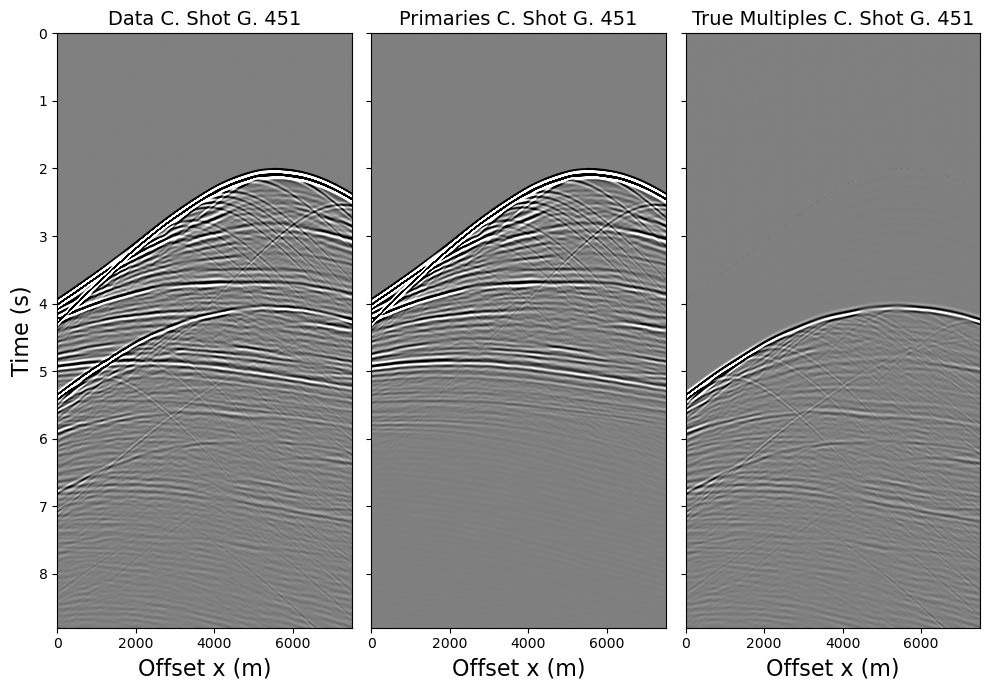

In [12]:
# Randomly plot CSG
vmax = 0.04 * np.amax(data)
vmin = -vmax
t0 = 0
t1 = t0 + (nt - 1) * dt
xmin = 0
xmax = nr*dx

ni = np.random.randint(data.shape[0])

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)
axs[0].imshow(data[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Data C. Shot G. {ni}',fontsize=14)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(primaries[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Primaries C. Shot G. {ni}',fontsize=14)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow(true_multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'True Multiples C. Shot G. {ni}',fontsize=14)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

Check if Common Channel Gathers look the same as Common Shot Gathers.

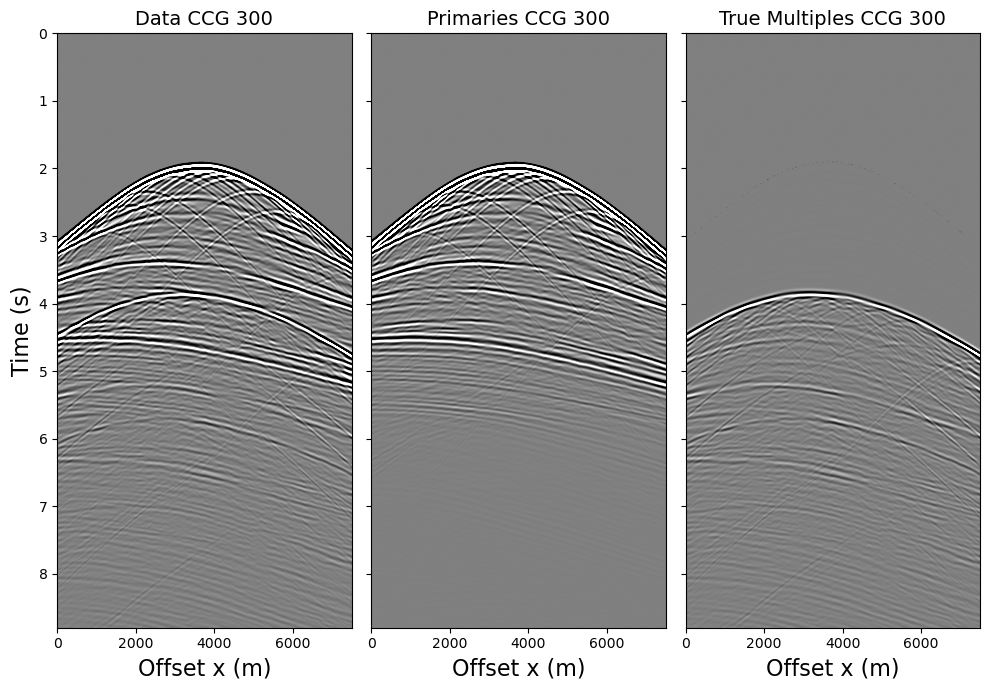

In [47]:
fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)
axs[0].imshow(data[:, ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Data CCG {ni}',fontsize=14)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)
axs[1].imshow(primaries[:, ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Primaries CCG {ni}',fontsize=14)
axs[1].set_xlabel('Offset x (m)',fontsize=16)
axs[2].imshow(true_multiples[:, ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'True Multiples CCG {ni}',fontsize=14)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

plt.tight_layout()

#### Create model of multiples with SRME

low pass filtersNow we use the Multi Dimensional Convolution from pylops to obtain an initial estimate of multiples from the total data, applying the 2D SRME where the data itself is used as the prediction operator:
$$ \hat{m}(s_k, r_k) = r_0 \sum_{x_k} {d(x_k, r_k)*d(s_k, x_k)} $$
where $r_0$ is the reflectivity coefficient of the free surface (-1) and $\hat{m}$ indicates that the estimate will have imperfections given that the seismic data does not represent perfect impulse responses of the subsurface (Dragonset et. al, 2010)

To remove wrap-around effects of the convolution, we will pad the data that goes into the kernel of the multideconvolutional operator and also apply a taper to avoid sudden transition from data to 0. We will also apply a taper along the receivers axis to avoid edge effects in the predicted multiples.


#### Padding

In [197]:
p = 3  # the bigger, the smaller the padding
data_p = np.concatenate((data, np.zeros((data.shape[0], data.shape[1], data.shape[2]//p))), axis=-1)
data_p.shape

(600, 600, 2933)

#### Vertical Taper

In [198]:
v_taper = np.ones_like(data_p)

M = 200
n = np.arange(0, M)
theta = n * (np.pi/2) / M
semi_hann = np.cos(theta)

for i in range(v_taper.shape[0]):
    for j in range(v_taper.shape[1]):
        v_taper[i, j, p*v_taper.shape[2]//(p+1) - M: p*v_taper.shape[2]//(p+1)] = semi_hann
        v_taper[i, j, p*v_taper.shape[2]//(p+1): v_taper.shape[2]] *= 0

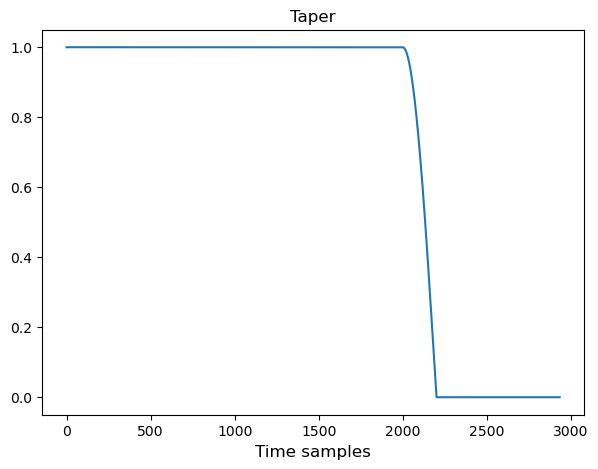

In [199]:
fig, axs = plt.subplots(1, 1, figsize=(7,5))

axs.plot(v_taper[300, 300])
axs.set_xlabel('Time samples', fontsize=12)
axs.set_title('Taper')

plt.show()

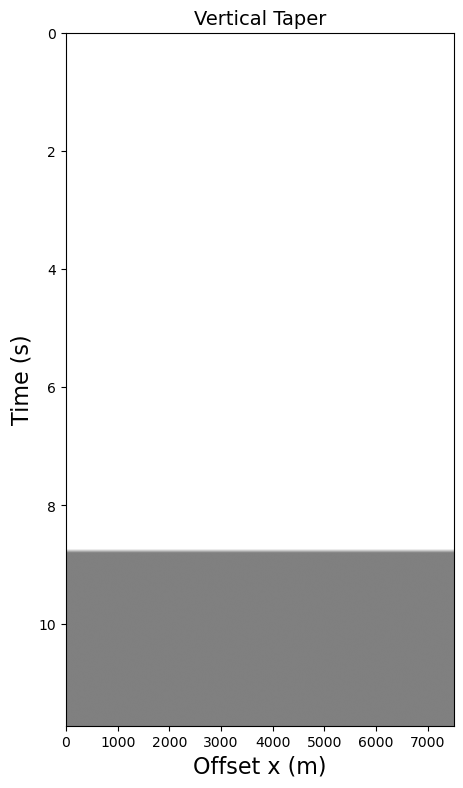

In [200]:
t0 = 0
t1 = t0 + (data_p.shape[2] - 1) * dt
xmin = 0
xmax = data_p.shape[1]*dx

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 1, figsize=(5,9),sharey=True)
axs.imshow(v_taper[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs.set_title(f'Vertical Taper',fontsize=14)
axs.set_xlabel('Offset x (m)',fontsize=16)
axs.set_ylabel('Time (s)',fontsize=16)

plt.show()

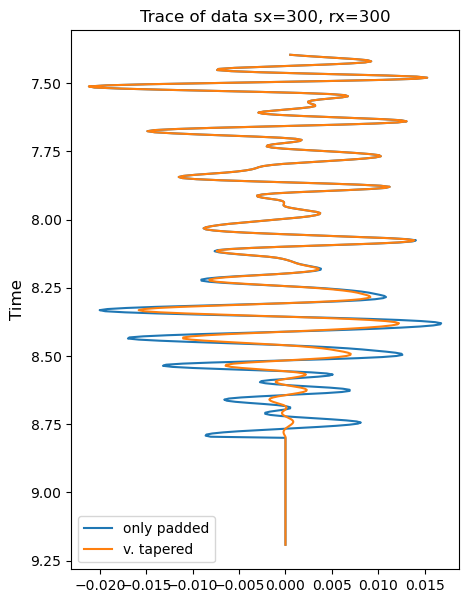

In [201]:
data_vt = np.multiply(data_p, v_taper)  # data vertically tapered

fig, ax = plt.subplots(1, 1, figsize=(5,7))

sx, rx = 300, 300

y = np.arange(3*v_taper.shape[2]//4 - M - 150,3*v_taper.shape[2]//4 + 100)*dt

ax.plot(data_p[sx, rx, p*v_taper.shape[2]//(p+1) - M - 150: p*v_taper.shape[2]//(p+1) + 100], y, label='only padded')
ax.plot(data_vt[sx, rx, p*v_taper.shape[2]//(p+1) - M - 150: p*v_taper.shape[2]//(p+1) + 100], y, label='v. tapered')
ax.invert_yaxis()
ax.set_ylabel('Time', fontsize=12)
ax.set_title(f'Trace of data sx={sx}, rx={rx}')

plt.legend()
plt.show()

#### Horizontal Taper

In [202]:
h_taper = np.ones_like(data_p)

M = 100
n = np.arange(0, M)
theta = n * (np.pi/2) / M
semi_hann_l = np.sin(theta)  # left side
semi_hann_r = np.cos(theta)  # right side

for i in range(h_taper.shape[0]):
    for j in range(h_taper.shape[2]):
        h_taper[i, 0: M, j] = semi_hann_l
        h_taper[i, h_taper.shape[1] - M: h_taper.shape[1], j] = semi_hann_r

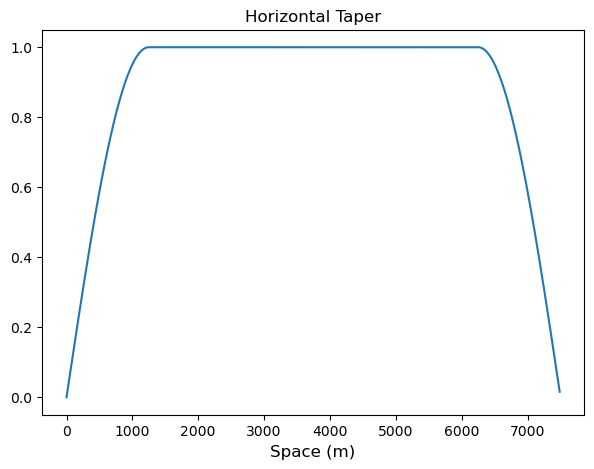

In [203]:
data_t = np.multiply(data_vt, h_taper).astype(np.float32)# data tapered

fig, axs = plt.subplots(1, 1, figsize=(7,5))

x = np.arange(data_t.shape[1])*dx

axs.plot(x, h_taper[300,:,1000])
axs.set_xlabel('Space (m)', fontsize=12)
axs.set_title(f'Horizontal Taper')

plt.show()

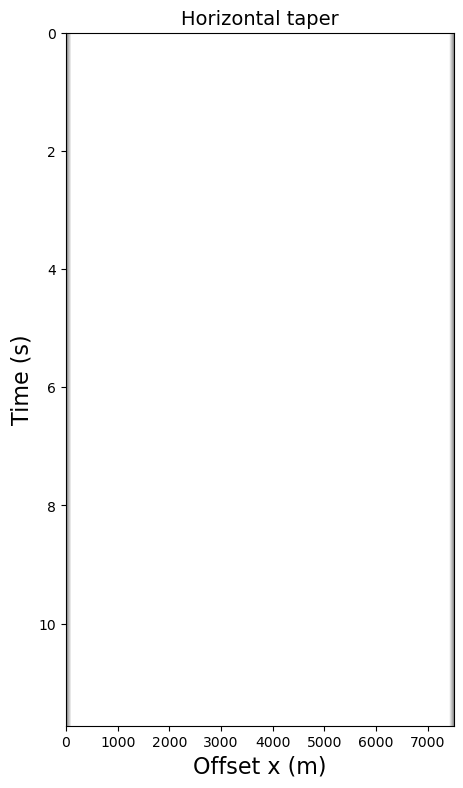

In [204]:
t0 = 0
t1 = t0 + (data_t.shape[2] - 1) * dt
xmin = 0
xmax = data_t.shape[1]*dx

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 1, figsize=(5,9),sharey=True)
axs.imshow(h_taper[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs.set_title(f'Horizontal taper',fontsize=14)
axs.set_xlabel('Offset x (m)',fontsize=16)
axs.set_ylabel('Time (s)',fontsize=16)

plt.show()

In [205]:
# Delete previous data to save memory
del data_vt, h_taper, v_taper

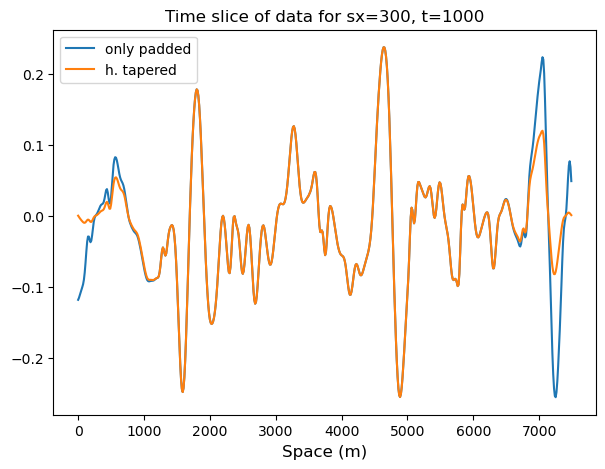

In [206]:
fig, axs = plt.subplots(1, 1, figsize=(7,5))

sx, t = 300, 1000

x = np.arange(data_t.shape[1])*dx

axs.plot(x, data_p[sx, :, t], label='only padded')
axs.plot(x, data_t[sx, :, t], label='h. tapered')
axs.set_xlabel('Space (m)', fontsize=12)
axs.set_title(f'Time slice of data for sx={sx}, t={t}')

plt.legend()
plt.show()

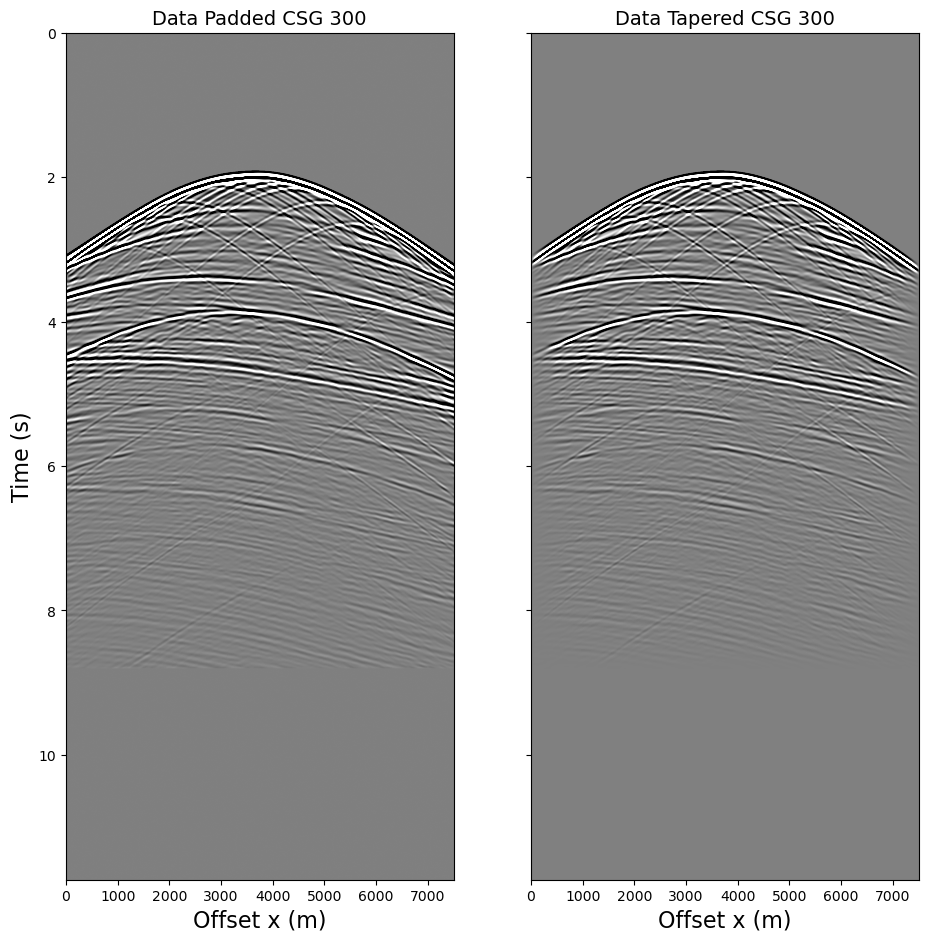

In [207]:
fig, axs = plt.subplots(1, 2, figsize=(11,11), sharey=True)
axs[0].imshow(data_p[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Data Padded CSG 300',fontsize=14)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)

axs[1].imshow(data_t[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Data Tapered CSG 300',fontsize=14)
axs[1].set_xlabel('Offset x (m)',fontsize=16)

plt.show()

In [26]:
data_fft = np.fft.rfft(data_t, axis=-1)

data_fft = data_fft.transpose(2, 0, 1).astype(np.complex64)

In [27]:
# Create the multi-dimensional convolution operator
MDCop = pylops.waveeqprocessing.MDC(
    data_fft,
    nt=data_t.shape[2],      # number of time samples
    nv=data_t.shape[0],  # number of sources
    dt=dt,      # dt = 0.004 s
    dr=dx,      # dx = 12.5 m
    twosided = False,
    transpose = False
)
MDCop.shape

(1055880000, 1055880000)

In [ ]:
multiples =  MDCop @ data_t.transpose(2,1,0).ravel()

In [ ]:
multiples = multiples.reshape(data_t.shape[2], ns, nr)
multiples = multiples.transpose(1,2,0)
multiples = multiples[:,:, :true_multiples.shape[2]]
multiples.shape

In [208]:
# Delete previous data to save memory
del data_p, data_t, data_fft

In [14]:
multiples = np.load('../data/srme_multiples.npz')['arr_0']
multiples.shape

(600, 600, 2200)

In [15]:
# Normalize overestimated multiples 

multiples = -1*multiples / np.amax(abs(multiples))   # We multiply -1 to account for the reflectivity coefficient of the free surface
print('Min of multiples:', np.min(multiples), '\n', 'Max of multiples:', np.max(multiples), '\n', 'Mean of Multiples', np.mean(multiples))

# true_multiples = true_multiples / np.amax(abs(true_multiples))
print('Min of true_multiples:', np.min(true_multiples), '\n', 'Max of true_multiples:', np.max(true_multiples), '\n', 'Mean of true_multiples:', np.mean(true_multiples))

Min of multiples: -1.0 
 Max of multiples: 0.9558185 
 Mean of Multiples -2.334109e-06


In [16]:
# # Normalize data, primaries and true multiples to avoid different scales 

# data = data / np.amax(abs(data))
print('Min of data:', np.min(data), '\n', 'Max of data:', np.max(data), '\n', 'Mean of data', np.mean(data))

# primaries = primaries / np.amax(abs(primaries))
print('Min of primaries:', np.min(primaries), '\n', 'Max of primaries:', np.max(primaries), '\n', 'Mean of primaries:', np.mean(primaries))

Min of data: -5.4004669189453125 
 Max of data: 4.171270370483398 
 Mean of data 0.000155612023670519
Min of primaries: -5.400380611419678 
 Max of primaries: 3.9786198139190674 
 Mean of primaries: 0.00016260233422334437


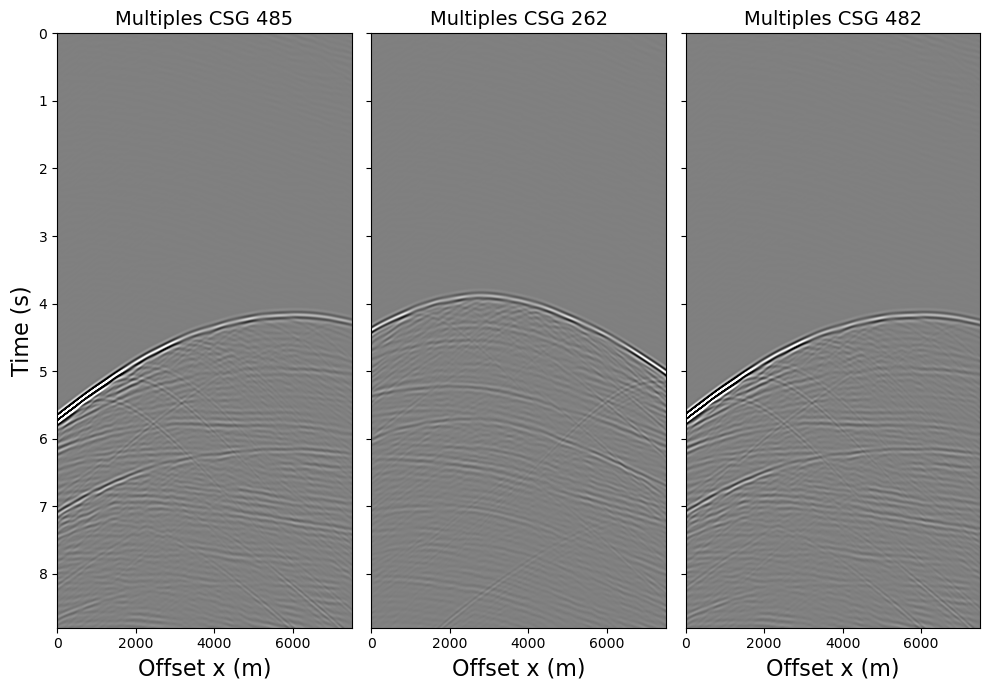

In [13]:
# Plot common shot gathers of the trimmed data
t0 = 0
t1 = t0 + (data.shape[2] - 1) * dt
xmin = 0
xmax = data.shape[1] * dx

vmax = 0.03 * np.amax(data)
vmin = -vmax

ni = np.random.randint(0, multiples.shape[0])

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)
axs[0].imshow(multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Multiples CSG {ni}',fontsize=14)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)

ni = np.random.randint(0, multiples.shape[0])
axs[1].imshow(multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'Multiples CSG {ni}',fontsize=14)
axs[1].set_xlabel('Offset x (m)',fontsize=16)

ni = np.random.randint(0, multiples.shape[0])
axs[2].imshow(multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title(f'Multiples CSG {ni}',fontsize=14)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

# Print relative error between true and estimated multiples
print('Relative error between true and estimated multiples: %.2f%%' % (100*np.linalg.norm(true_multiples[ni]-multiples[ni])/np.linalg.norm(true_multiples[ni])))

plt.tight_layout()

We see that we still have noise in the upper part, so we will trim the data to 3.5 seconds and then pad it to recuperate the lost shot data.

In [17]:
multiples = multiples[:, :, int(3.5/dt):]
multiples = np.concatenate((np.zeros((multiples.shape[0], multiples.shape[1], int(3.5/dt))), multiples), axis=-1)
multiples.shape

(600, 600, 2200)

Relative error between true and estimated multiples: 157.72%


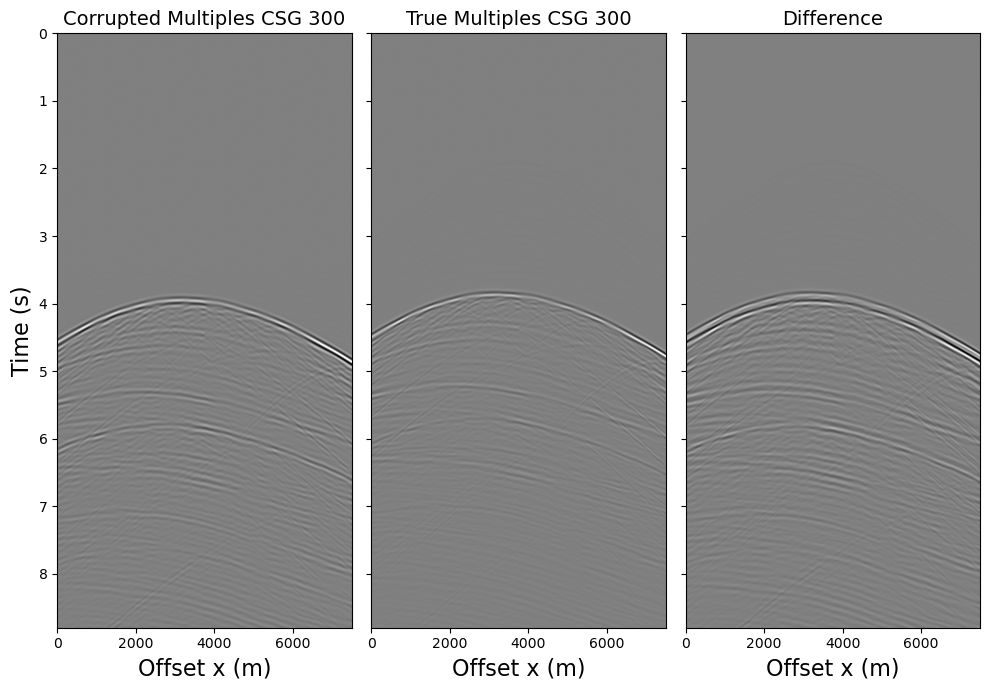

In [18]:
# Now we compare the estimated multiples with the true ones
t0 = 0
t1 = t0 + (data.shape[2] - 1) * dt
xmin = 0
xmax = data.shape[1] * dx

vmax = 0.03 * np.amax(data)
vmin = -vmax

ni = 300#np.random.randint(0, multiples.shape[0])

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)
axs[0].imshow(multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title(f'Corrupted Multiples CSG {ni}',fontsize=14)
axs[0].set_xlabel('Offset x (m)',fontsize=16)
axs[0].set_ylabel('Time (s)',fontsize=16)

axs[1].imshow(true_multiples[ni].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title(f'True Multiples CSG {ni}',fontsize=14)
axs[1].set_xlabel('Offset x (m)',fontsize=16)

axs[2].imshow((true_multiples[ni]-multiples[ni]).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=14)
axs[2].set_xlabel('Offset x (m)',fontsize=16)

# Print relative error between true and estimated multiples
print('Relative error between true and estimated multiples: %.2f%%' % (100*np.linalg.norm(true_multiples[ni]-multiples[ni])/np.linalg.norm(true_multiples[ni])))

plt.tight_layout()

#### Adaptive Subtraction
Now that we have a model of multiples, we will do adaptive subtraction with LSQR and ADMM and compare results, considering that we have the true multiples. Let's pick shot 300 and patch it in windows of 100*200.

In [19]:
def plot_patches(data, true_multiples, corr_multiples, est_multiples, nwin, filters, mult_filters=None, solver='',  patches=None):
    
    nover = (nwin[0] // 2, nwin[1] // 2)  # number of samples of overlapping part of window

    # reshape input data so it fits the patching
    nr = (nover[0]) * (data.shape[0] // nover[0])
    nt = (nover[1]) * (data.shape[1] // nover[1])

    data = data[:nr, :nt]
    true_multiples = true_multiples[:nr, :nt]
    corr_multiples = corr_multiples[:nr, :nt]

    # Create patching operator
    dimsd = (nr, nt)  # shape of 2-dimensional data
    nop = nwin  # size of model in the transformed domain
    nwins = (nr // (nwin[0] // 2) - 1, nt // (nwin[1] // 2) - 1)
    dims = (nwins[0] * nop[0],  # shape of 2-dimensional model
            nwins[1] * nop[1])
    I = pylops.Identity(nwin[0] * nwin[1])

    # Get the patching operators
    PatchOpH = pylops.signalprocessing.Patch2D(I, dims, dimsd, nwin, nover, nop, tapertype='none', design=False)
    PatchOp = pylops.signalprocessing.Patch2D(I, dims, dimsd, nwin, nover, nop, tapertype='hanning', design=False)

    # Patch the data
    data_patched = PatchOpH.H * data.ravel()
    mult_patched = PatchOpH.H * true_multiples.ravel()
    corr_mult_patched = PatchOpH.H * corr_multiples.ravel()
    est_mult_patched = PatchOpH.H * est_multiples.ravel()

    # Reorder the data so that every row is a single patch
    num_patches = nwins[0] * nwins[1]
    
    data_patched = np.reshape(data_patched, (num_patches, nwin[0] * nwin[1]))
    mult_patched = np.reshape(mult_patched, (num_patches, nwin[0] * nwin[1]))
    corr_mult_patched = np.reshape(corr_mult_patched, (num_patches, nwin[0] * nwin[1]))
    est_mult_patched = np.reshape(est_mult_patched, (num_patches, nwin[0] * nwin[1]))
    
    print('Number of patches: ', num_patches)
    
    if patches is None:
        
        patches = np.arange(num_patches)    
    
    for i in patches:

        data_patch_i = np.reshape(data_patched[i], (nwin[0], nwin[1])) 
        mult_patch_i = np.reshape(mult_patched[i], (nwin[0], nwin[1]))       
        corr_mult_patch_i = np.reshape(corr_mult_patched[i], (nwin[0], nwin[1]))
        est_mult_patch_i = np.reshape(est_mult_patched[i], (nwin[0], nwin[1]))

        r_e = np.linalg.norm(mult_patch_i-est_mult_patch_i)/np.linalg.norm(mult_patch_i)
        
        print(f'Relative error: {round(r_e,3)*100}%')
        
        if mult_filters is not None:
            
            fig, axs = plt.subplots(1, 3, figsize=(10, 2.5), sharey=True)

            axs[0].plot(mult_filters[i, 0], marker='o', markersize=3)
            axs[0].set_title(f'{solver} filter for patch {i} shot i-1', fontsize=10)

            axs[1].plot(mult_filters[i, 1], marker='o', markersize=3, label='Using 3 Shots')
            axs[1].plot(filters[i], marker='o', markersize=3, label='Using 1 Shot')
            axs[1].set_title(f'{solver} filter for patch {i} shot i', fontsize=10)

            axs[2].plot(mult_filters[i, 2], marker='o', markersize=3)
            axs[2].set_title(f'{solver} filter for patch {i} shot i+1', fontsize=10)

            axs[1].legend(fontsize=8)  
        
        else:
            
            plt.figure(figsize=(3,2.5))
            plt.plot(filters[i], marker='o', markersize=3)
            plt.title(f'{solver} filter for patch {i}', fontsize=10)

        fig, axs = plt.subplots(1, 5, figsize=(15, 3), sharey=True)
        
        vmax=np.max(abs(data_patch_i))
        vmin=-vmax

        im0 = axs[0].imshow(data_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[0].set_title(f'Data patch {i}', fontsize=10)
        axs[0].xaxis.set_tick_params(labelbottom=False)
        axs[0].yaxis.set_tick_params(labelleft=False)     
        axs[0].set_xticks([])
        axs[0].set_yticks([])
        divider = make_axes_locatable(axs[0])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im0, cax=cax, orientation='horizontal')
        
        im1 = axs[1].imshow((data_patch_i - mult_patch_i).T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[1].set_title(f'Primaries patch {i}', fontsize=10)
        axs[1].xaxis.set_tick_params(labelbottom=False)
        axs[1].yaxis.set_tick_params(labelleft=False)     
        axs[1].set_xticks([])
        axs[1].set_yticks([])
        divider = make_axes_locatable(axs[1])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im1, cax=cax, orientation='horizontal')
        
        im2 = axs[2].imshow(mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[2].set_title(f'True multiples patch {i}', fontsize=10)
        axs[2].xaxis.set_tick_params(labelbottom=False)
        axs[2].yaxis.set_tick_params(labelleft=False)     
        axs[2].set_xticks([])
        axs[2].set_yticks([])
        divider = make_axes_locatable(axs[2])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im2, cax=cax, orientation='horizontal')
        
        im3 = axs[3].imshow(corr_mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[3].set_title(f'Corrupted multiples patch {i}', fontsize=10)
        axs[3].xaxis.set_tick_params(labelbottom=False)
        axs[3].yaxis.set_tick_params(labelleft=False)     
        axs[3].set_xticks([])
        axs[3].set_yticks([])
        divider = make_axes_locatable(axs[3])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im3, cax=cax, orientation='horizontal')
        
        im4 = axs[4].imshow(est_mult_patch_i.T, aspect='auto', vmax=vmax, vmin=vmin, cmap='gray')
        axs[4].set_title(f'Estimated multiples patch {i}', fontsize=10)
        axs[4].xaxis.set_tick_params(labelbottom=False)
        axs[4].yaxis.set_tick_params(labelleft=False)     
        axs[4].set_xticks([])
        axs[4].set_yticks([])
        divider = make_axes_locatable(axs[4])
        cax = divider.append_axes('bottom', size='5%', pad=0.05)
        fig.colorbar(im4, cax=cax, orientation='horizontal')   

        plt.tight_layout()
        plt.show()

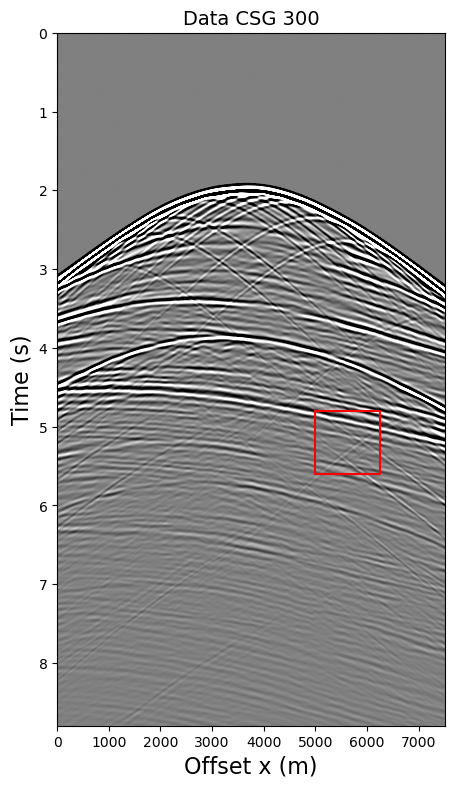

In [50]:
nwins = (nr // (nwin[0] // 2) - 1, nt // (nwin[1] // 2) - 1)

fig, axs = plt.subplots(1, 1, figsize=(5,9),sharey=True)
axs.imshow(data[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs.set_title(f'Data CSG 300',fontsize=14)
axs.set_xlabel('Offset x (m)',fontsize=16)
axs.set_ylabel('Time (s)',fontsize=16)

x, y, = np.array([4*nwin[0], 4*nwin[0], 5*nwin[0], 5*nwin[0], 4*nwin[0]])*dx, np.array([6*nwin[1], 7*nwin[1], 7*nwin[1], 6*nwin[1], 6*nwin[1]])*dt
plt.plot(x, y, c='r', lw=1.5)

plt.show()

### Adaptive subtraction with LSQR

In [51]:
start_time = time.time()/60

nfilt = 39

damp = 0

prim_lsqr, mult_lsqr, filt_lsqr = adasubtraction(data[300], multiples[300], solver='lsqr', nfilt=nfilt,
                                                                    clipping=True,
                                                                    nwin=nwin,
                                                                    solver_dict={'x0':np.zeros(nfilt),
                                                                                 'niter':10, 
                                                                                 'damp':damp})

print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 0.061 minutes ---


Number of patches:  231
Relative error: 17.4%


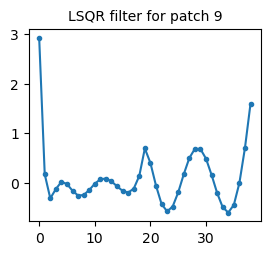

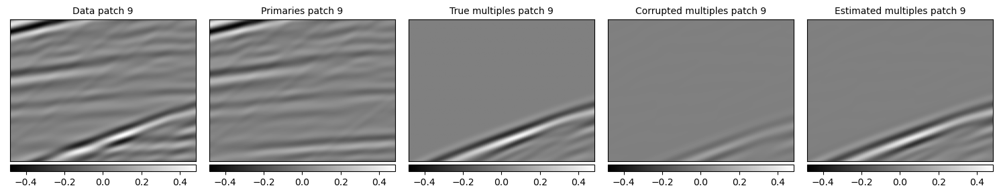

Relative error: 52.0%


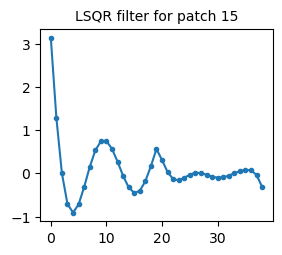

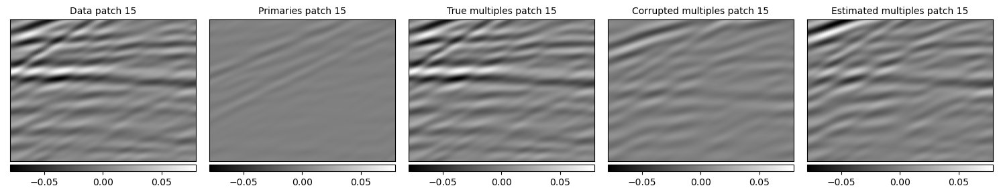

Relative error: 48.4%


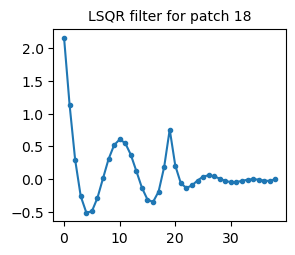

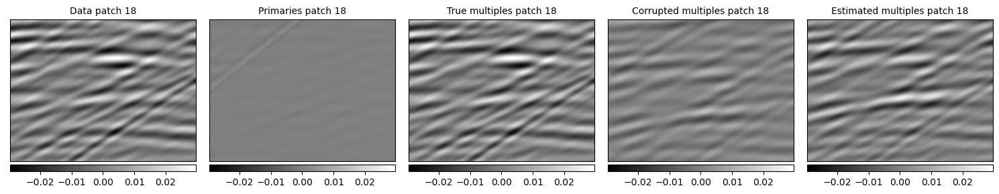

Relative error: 17.299999999999997%


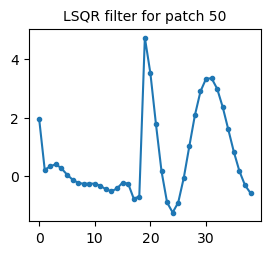

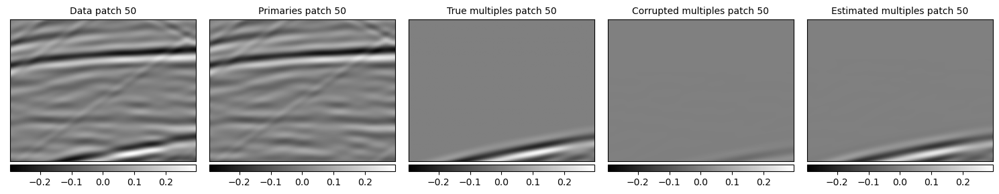

Relative error: 50.9%


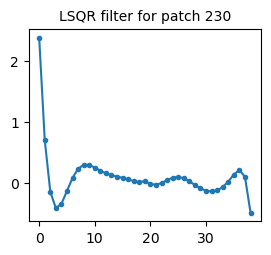

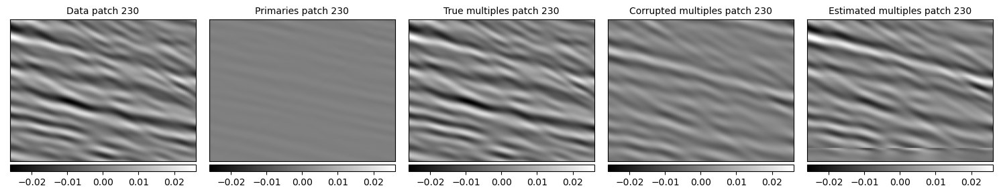

In [77]:
plot_patches(data[300], true_multiples[300], multiples[300], mult_lsqr, nwin=nwin, filters=filt_lsqr, solver='LSQR', patches=[9, 15, 18, 50, 230])

Relative Error: 26.363 %


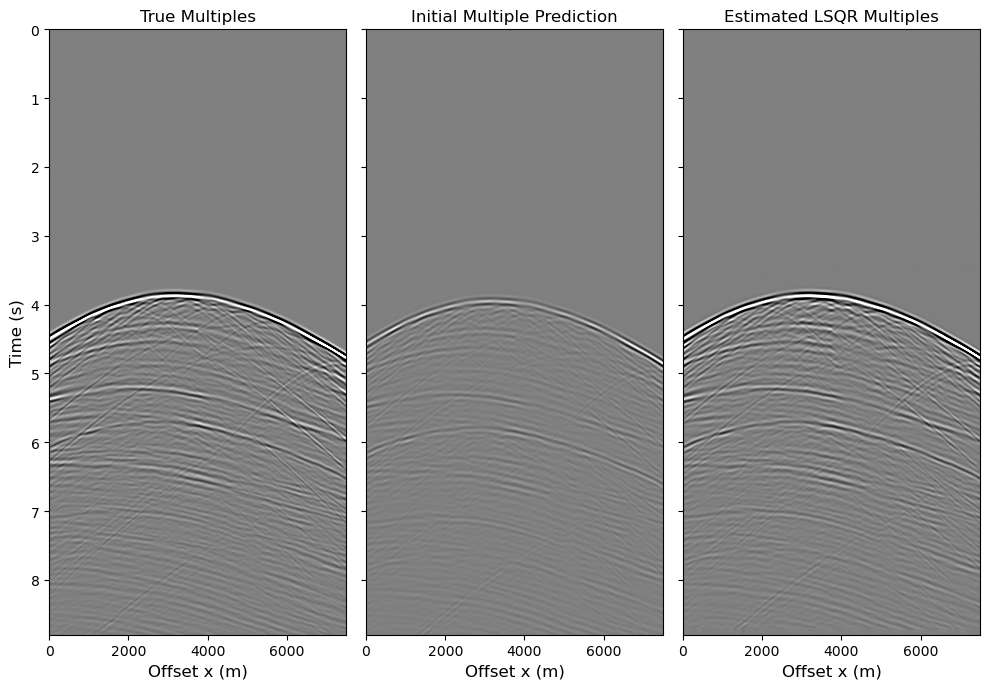

In [53]:
diff = (np.linalg.norm(true_multiples[300]-mult_lsqr)/np.linalg.norm(true_multiples[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Initial Multiple Prediction',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(mult_lsqr.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Estimated LSQR Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative Error: 3.551 %


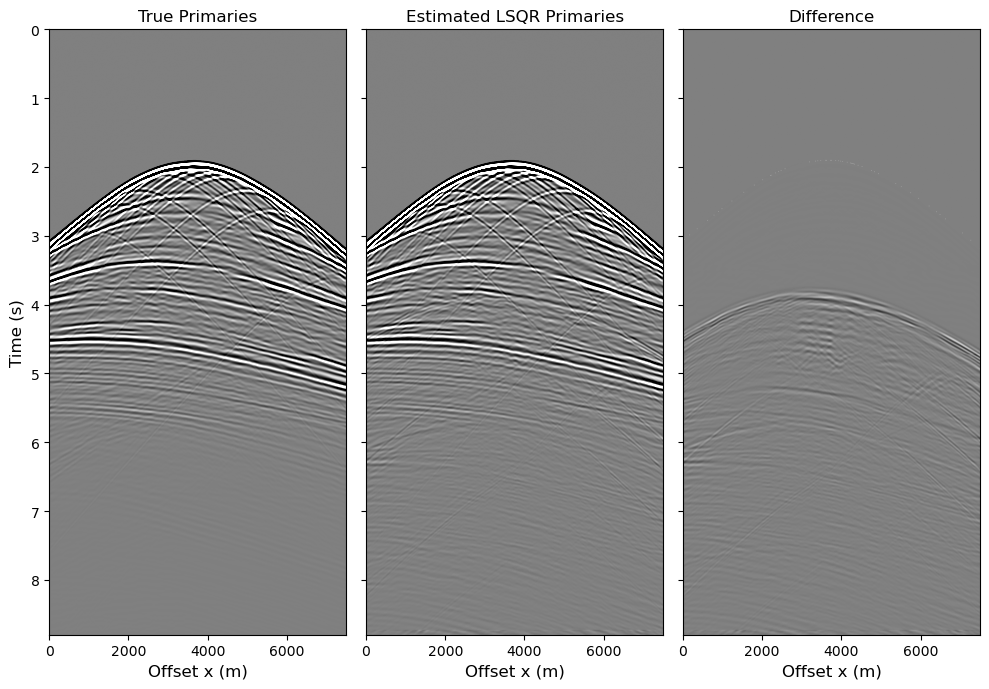

In [54]:
diff = (np.linalg.norm(primaries[300]-prim_lsqr)/np.linalg.norm(primaries[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(prim_lsqr.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Estimated LSQR Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[300]-prim_lsqr).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

### Adaptive Subtraction with ADMM

#### 1) Using one multiple prediction shot and optimizing for each patch

In [55]:
start_time = time.time()/60

nfilt = 39
rho = 2  
eps = 0.6 

prim_admm1, mult_admm1, filt_admm1 = adasubtraction_parallel(data[300], multiples[300], solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 0.479 minutes ---


Number of patches:  231
Relative error: 14.899999999999999%


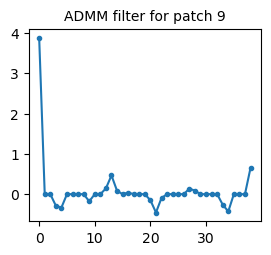

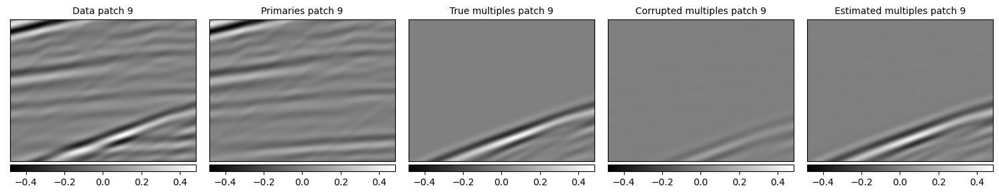

Relative error: 51.4%


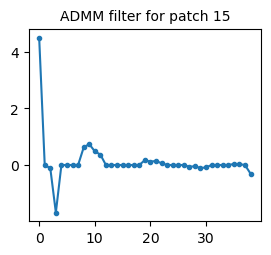

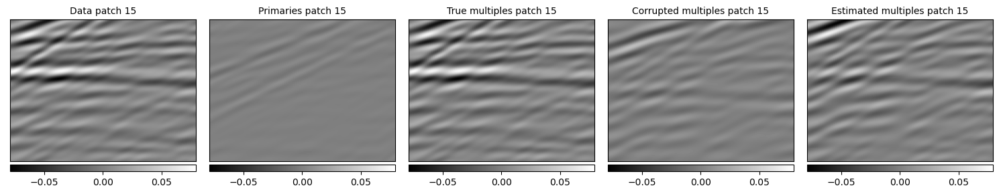

Relative error: 48.6%


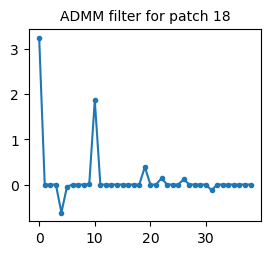

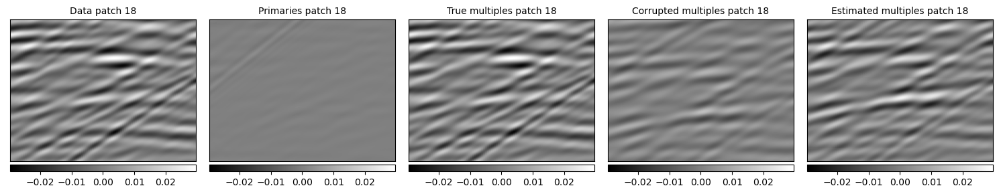

Relative error: 15.6%


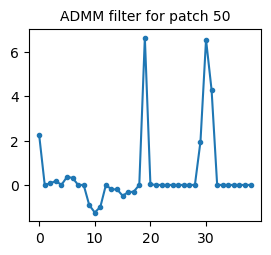

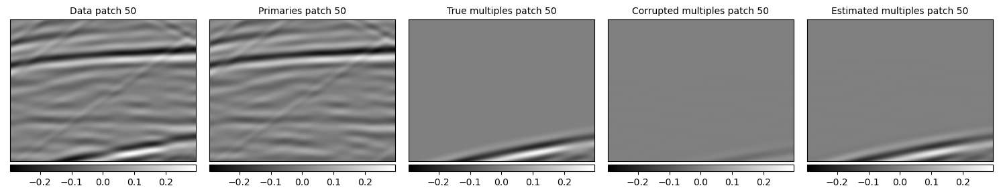

Relative error: 51.4%


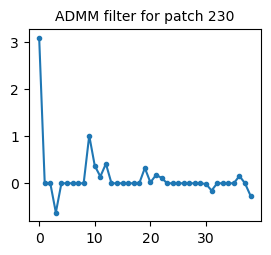

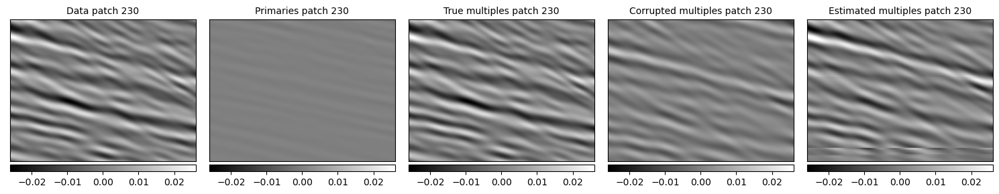

In [56]:
plot_patches(data[300], true_multiples[300], multiples[300], mult_admm1, nwin=nwin, filters=filt_admm1, solver='ADMM', patches=[9, 15, 18, 50, 230])

Relative Error: 24.162 %


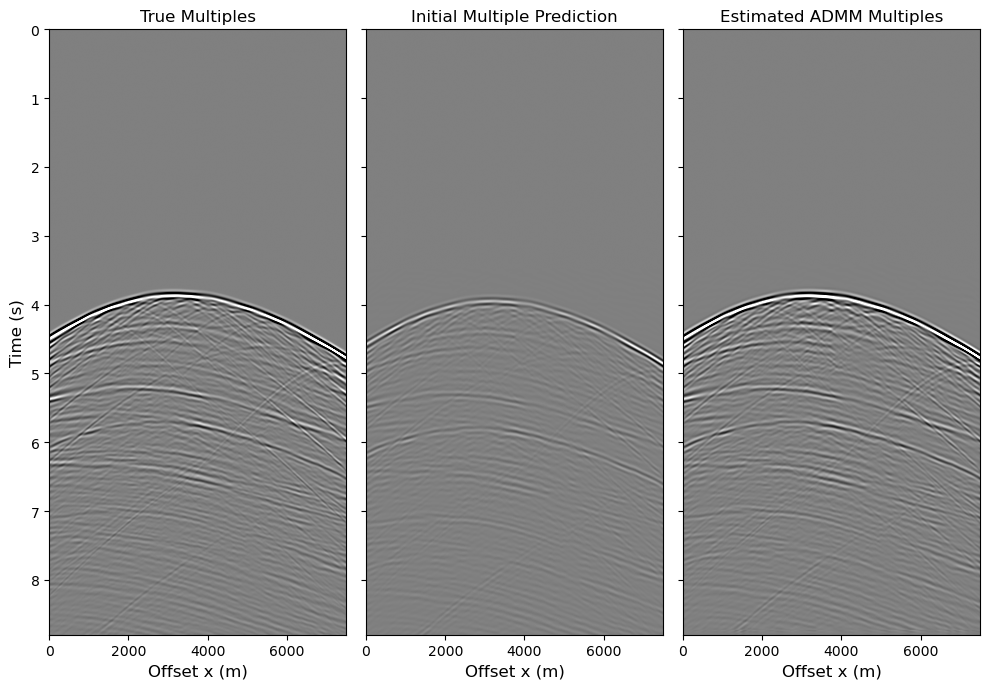

In [57]:
diff = (np.linalg.norm(true_multiples[300]-mult_admm1)/np.linalg.norm(true_multiples[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Initial Multiple Prediction',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(mult_admm1.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Estimated ADMM Multiples',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative Error: 3.261 %


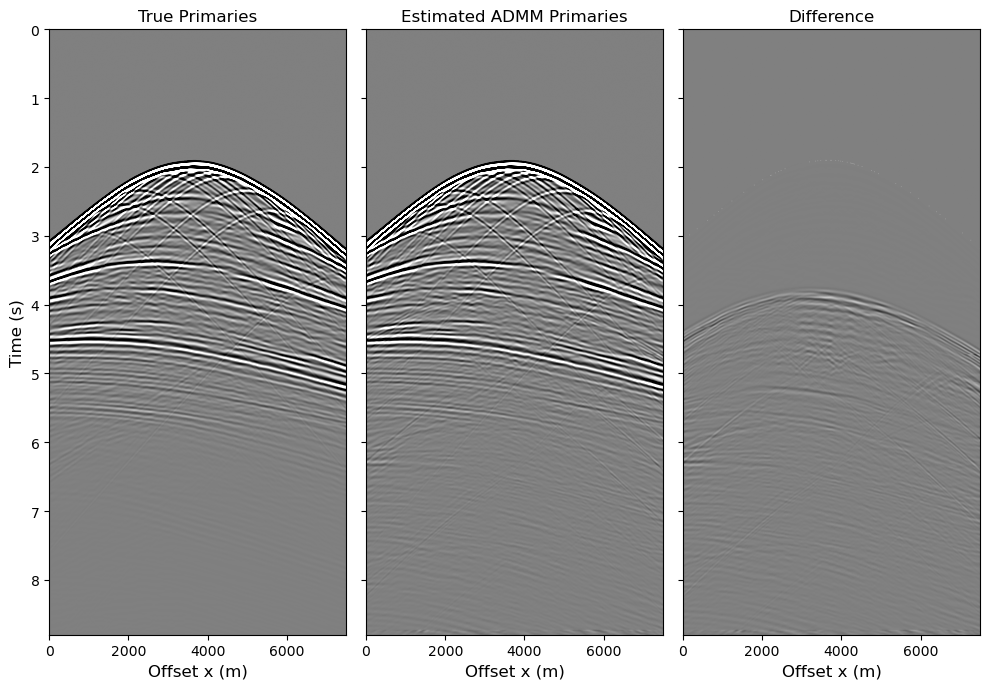

In [58]:
diff = (np.linalg.norm(primaries[300]-prim_admm1)/np.linalg.norm(primaries[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(prim_admm1.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Estimated ADMM Primaries',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[300]-prim_admm1).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

#### 2) Using one multiple prediction shot and doing a joint optimization for all patches.

In [59]:
start_time = time.time()/60

nfilt = 39
rho = 2  
eps = 0.6 

prim_admm2, mult_admm2, filt_admm2 = adasubtraction_joint(data[300], multiples[300], solver='ADMM', nfilt=nfilt,
                                                                                    nwin=nwin,
                                                                                    solver_dict={'rho':rho,
                                                                                                 'nouter':200,
                                                                                                 'ninner':5,
                                                                                                 'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

(3080000, 6006)
--- 4.667 minutes ---


Number of patches:  231
Relative error: 16.400000000000002%


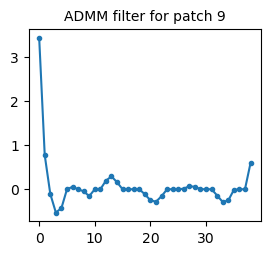

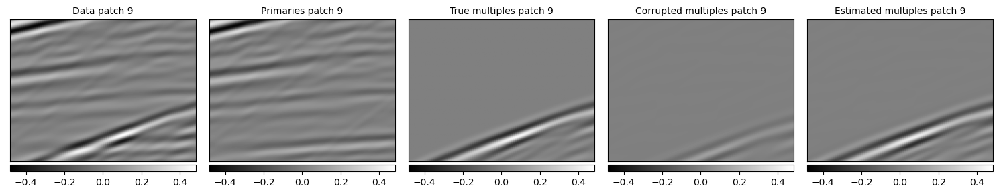

Relative error: 51.300000000000004%


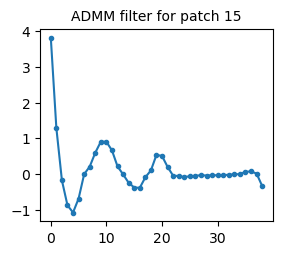

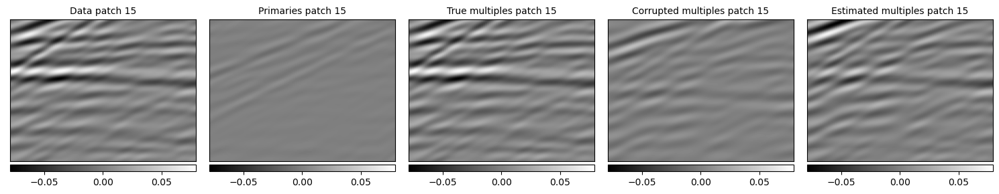

Relative error: 47.8%


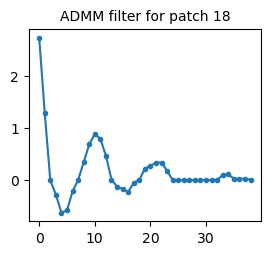

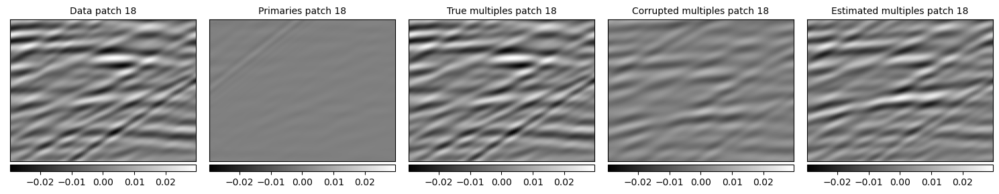

Relative error: 16.900000000000002%


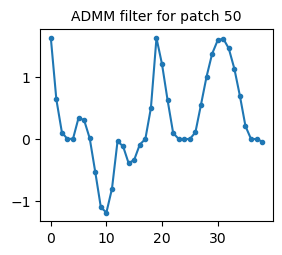

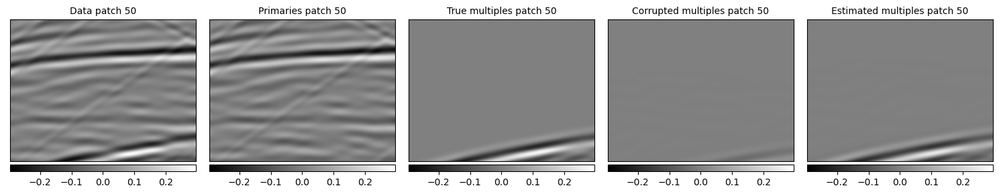

Relative error: 53.6%


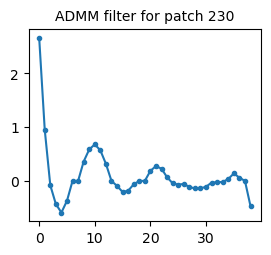

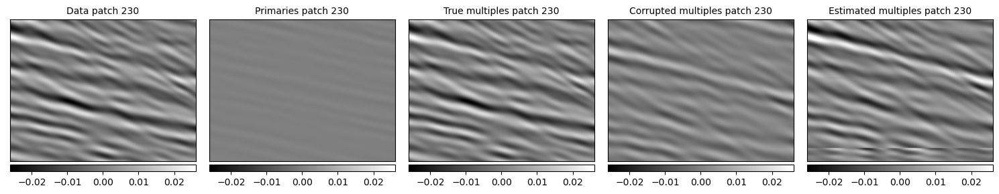

In [60]:
plot_patches(data[300], true_multiples[300], multiples[300], mult_admm2, nwin=nwin, solver='ADMM', filters=filt_admm2, patches=[9, 15, 18, 50, 230])

Relative Error: 24.602 %


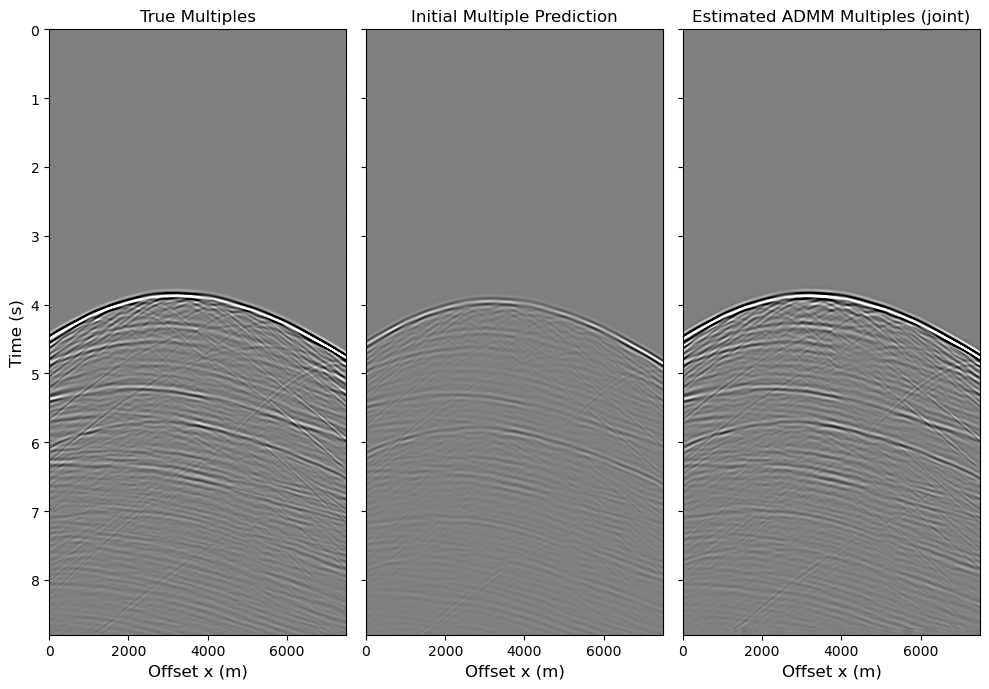

In [61]:
diff = (np.linalg.norm(true_multiples[300]-mult_admm2)/np.linalg.norm(true_multiples[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Initial Multiple Prediction',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(mult_admm2.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Estimated ADMM Multiples (joint)',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative Error: 3.319 %


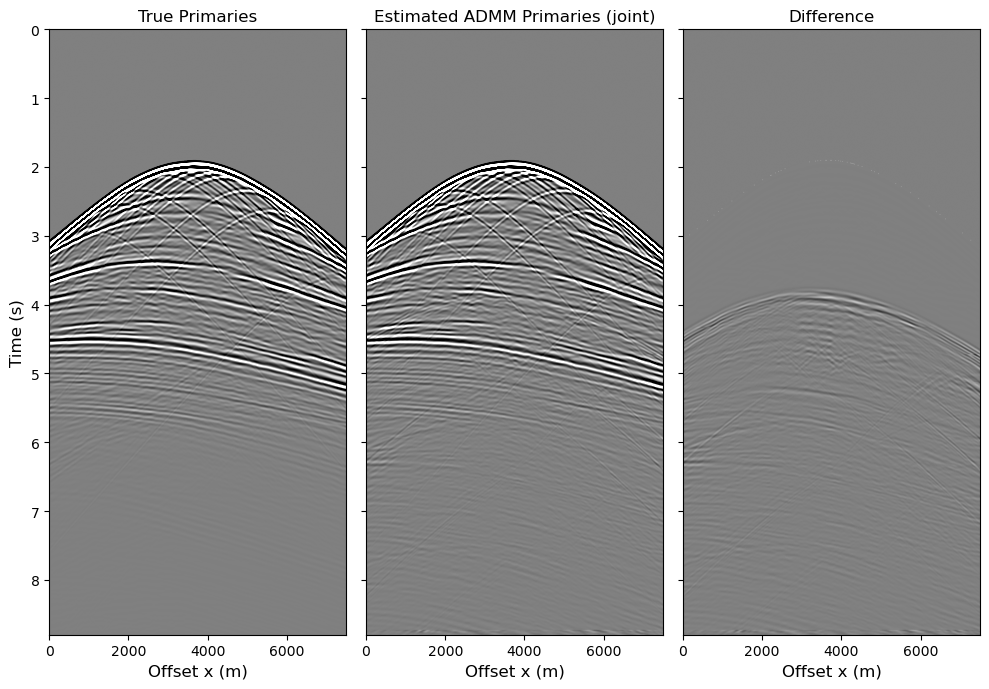

In [62]:
diff = (np.linalg.norm(primaries[300]-prim_admm2)/np.linalg.norm(primaries[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(prim_admm2.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Estimated ADMM Primaries (joint)',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[300]-prim_admm2).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

#### 3) Using 3 multiple prediction shots (previous-current-following) and optimizing for each patch.

In [63]:
mults = np.array([multiples[299], multiples[300], multiples[301]])

In [64]:
start_time = time.time()/60

nfilt = 39
rho = 2  
eps = 0.6 

prim_admm3, mult_admm3, filt_admm3 = adasubtraction_mult(data[300], mults, solver='ADMM', nfilt=nfilt,
                                                                        nwin=nwin,
                                                                        solver_dict={'rho':rho,
                                                                                     'nouter':200,
                                                                                     'ninner':5,
                                                                                     'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 1.429 minutes ---


Number of patches:  231
Relative error: 14.6%


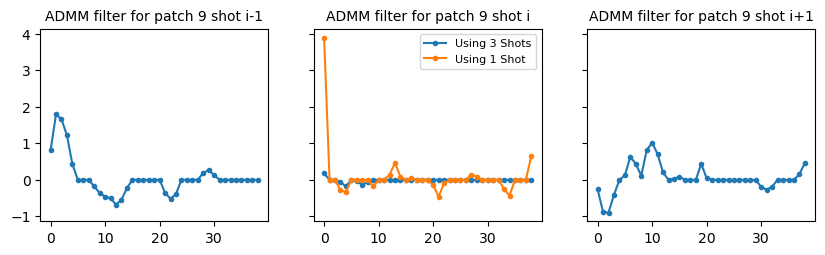

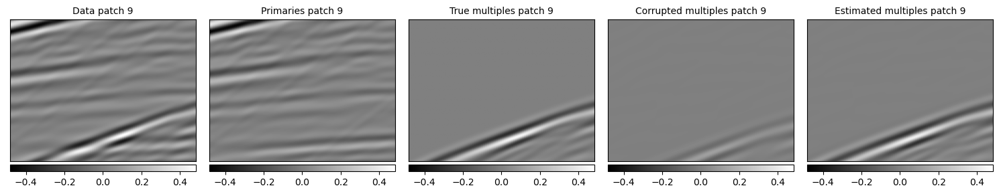

Relative error: 50.3%


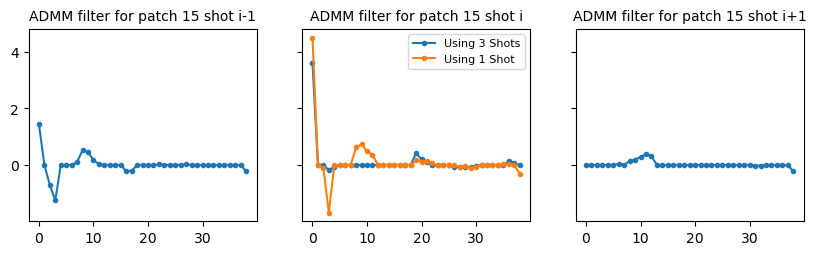

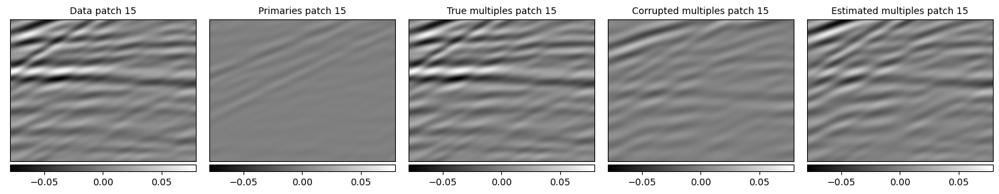

Relative error: 46.1%


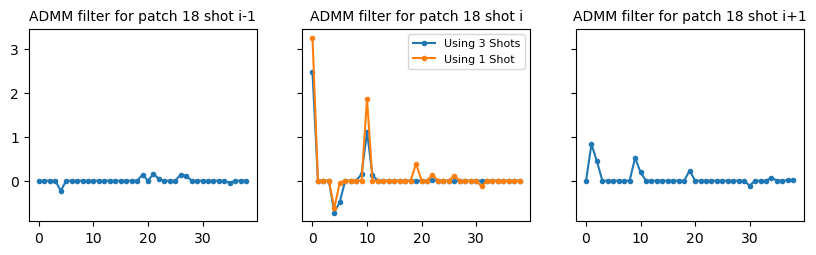

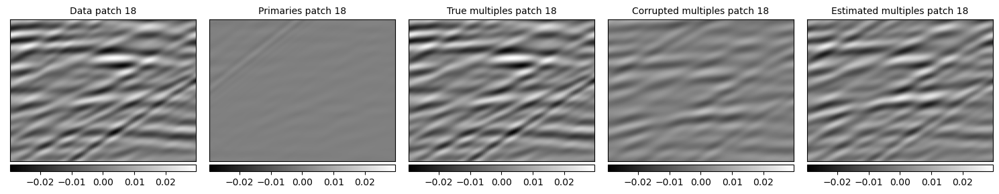

Relative error: 15.2%


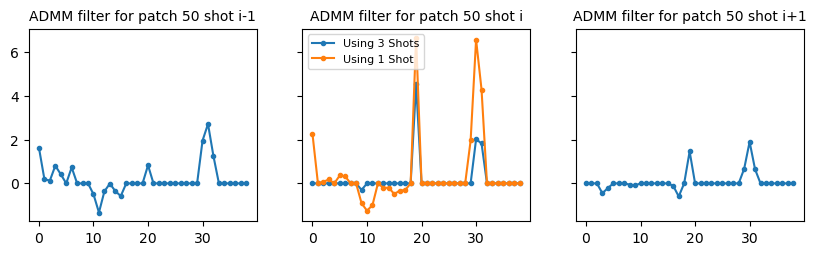

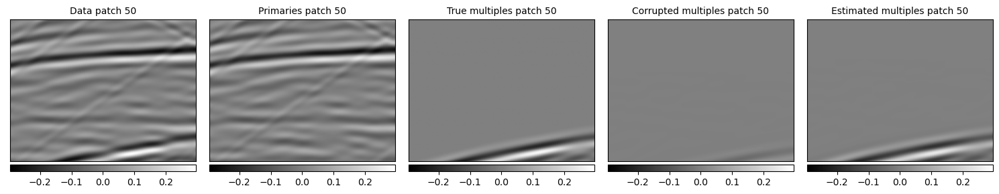

Relative error: 49.4%


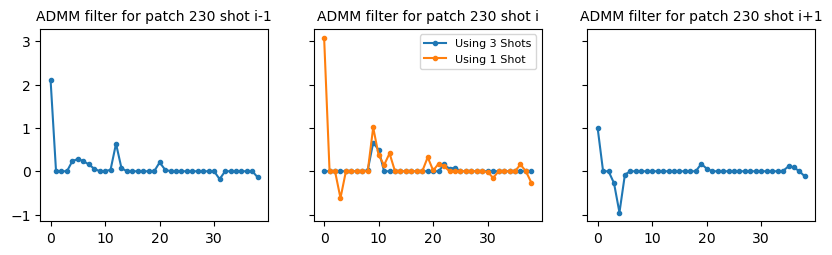

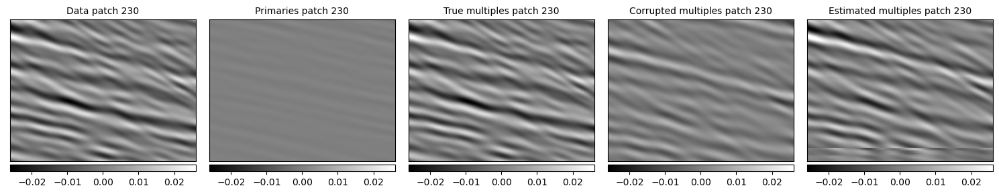

In [65]:
plot_patches(data[300], true_multiples[300], multiples[300], mult_admm3, nwin=nwin, solver='ADMM', filters=filt_admm1, mult_filters=filt_admm3, patches=[9, 15, 18, 50, 230])

Relative Error: 25.625 %


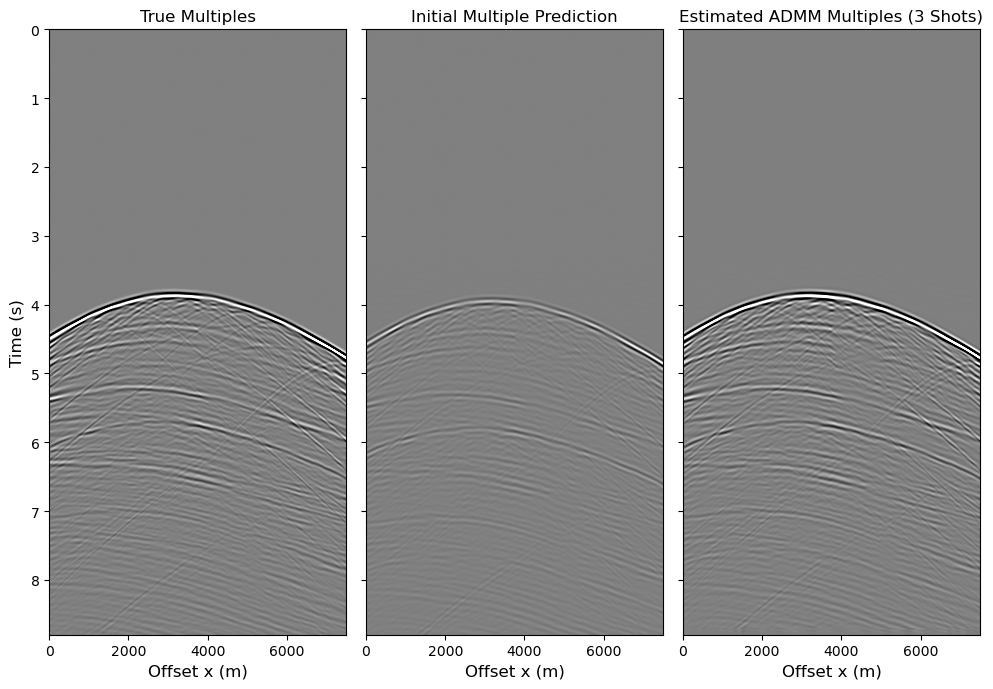

In [66]:
diff = (np.linalg.norm(true_multiples[300]-mult_admm3)/np.linalg.norm(true_multiples[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Initial Multiple Prediction',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(mult_admm3.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Estimated ADMM Multiples (3 Shots)',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative Error: 3.454 %


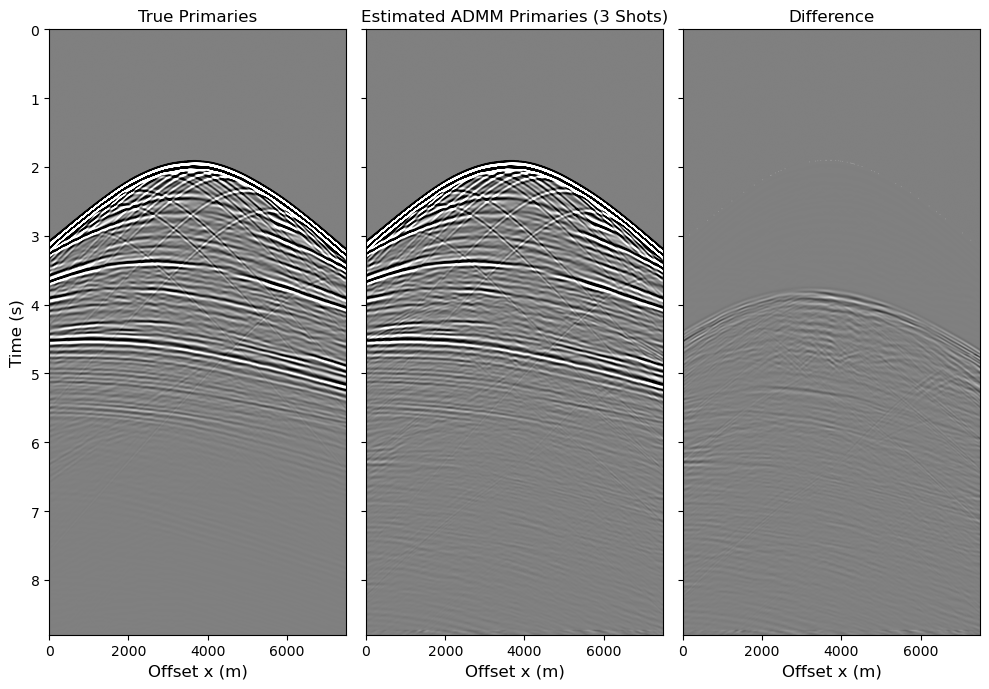

In [67]:
diff = (np.linalg.norm(primaries[300]-prim_admm3)/np.linalg.norm(primaries[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(prim_admm3.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Estimated ADMM Primaries (3 Shots)',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[300]-prim_admm3).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

#### 4) Using 3 multiple prediction shots (previous-current-following) and doing a joint optimization for all patches of each shot.

In [68]:
start_time = time.time()/60

nfilt = 39
rho = 2  
eps = 0.6 

prim_admm4, mult_admm4, filt_admm4 = adasubtraction_joint(data[300], mults, solver='ADMM', nfilt=nfilt,
                                                                        nwin=nwin,
                                                                        solver_dict={'rho':rho,
                                                                                     'nouter':200,
                                                                                     'ninner':5,
                                                                                     'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 13.082 minutes ---


Number of patches:  231
Relative error: 16.0%


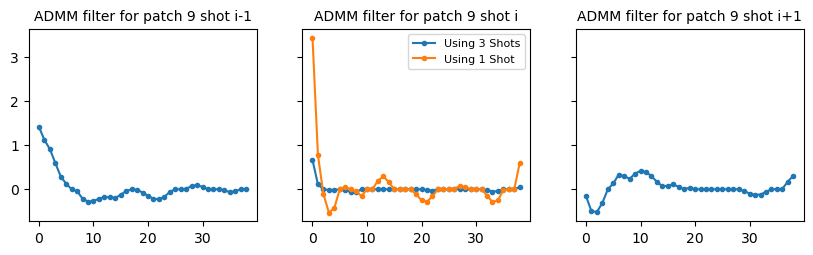

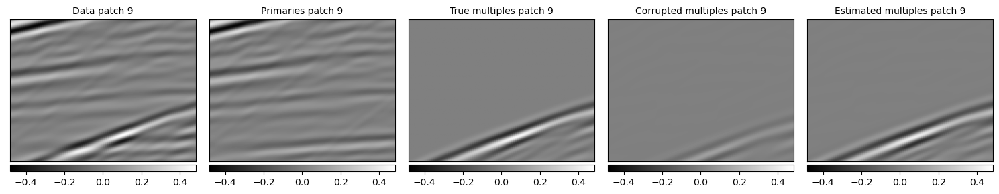

Relative error: 50.3%


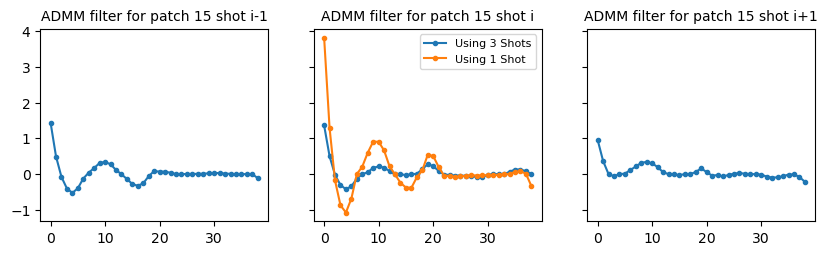

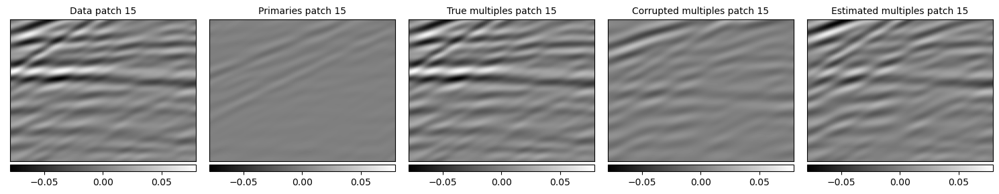

Relative error: 45.4%


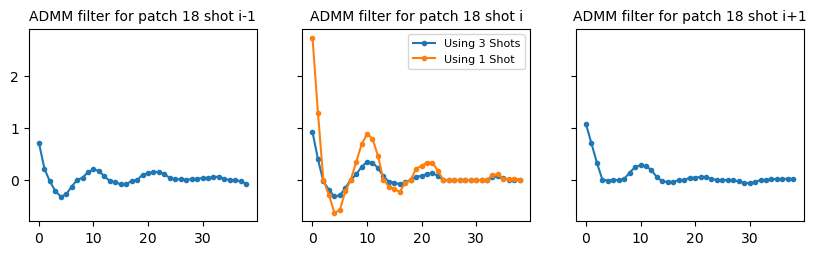

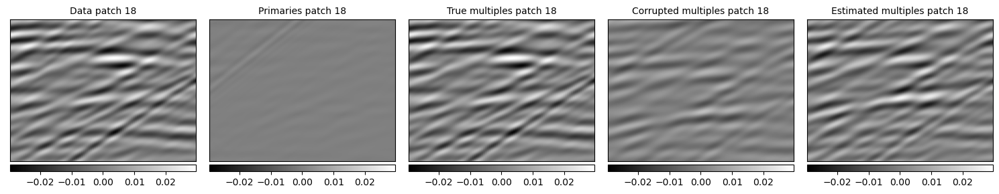

Relative error: 17.4%


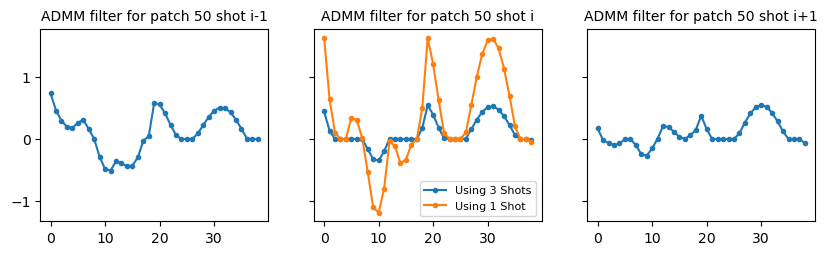

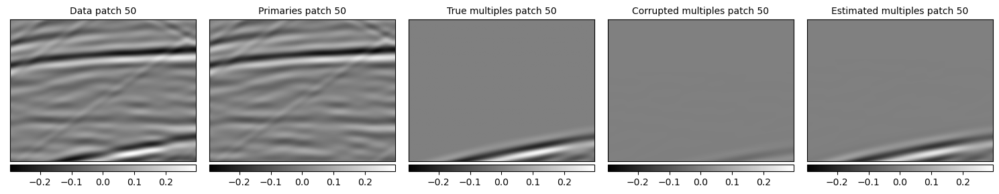

Relative error: 52.1%


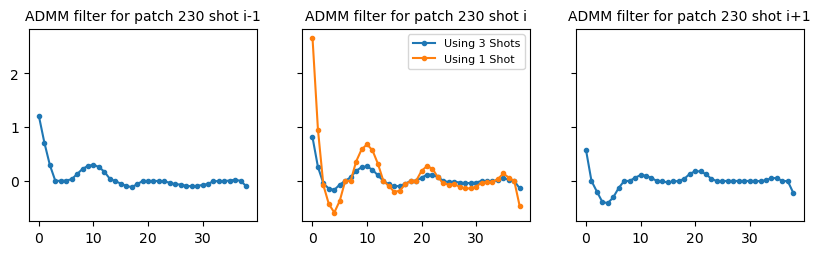

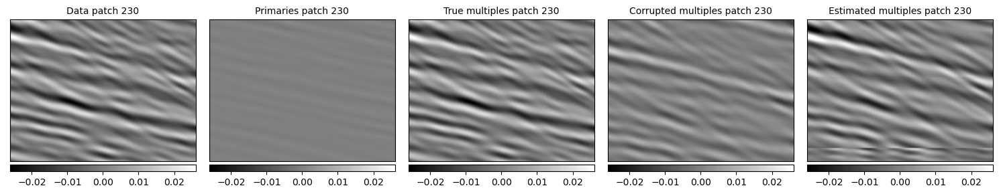

In [69]:
plot_patches(data[300], true_multiples[300], multiples[300], mult_admm4, nwin=nwin, solver='ADMM', filters=filt_admm2, mult_filters=filt_admm4, patches=[9, 15, 18, 50, 230])

Relative Error: 25.99 %


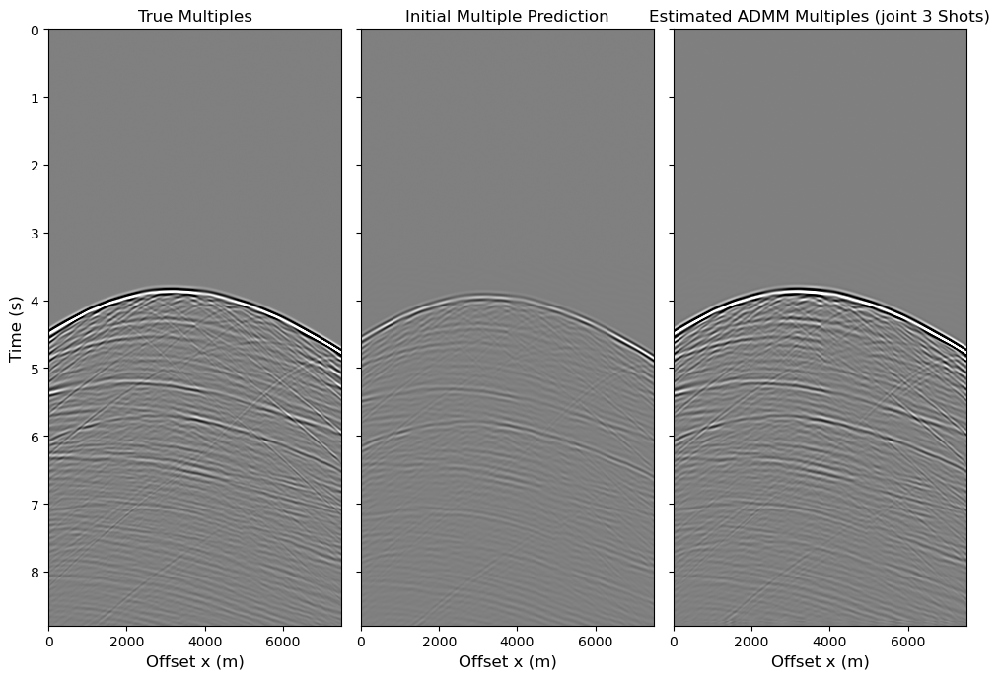

In [70]:
diff = (np.linalg.norm(true_multiples[300]-mult_admm4)/np.linalg.norm(true_multiples[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Initial Multiple Prediction',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(mult_admm4.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Estimated ADMM Multiples (joint 3 Shots)',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative Error: 3.502 %


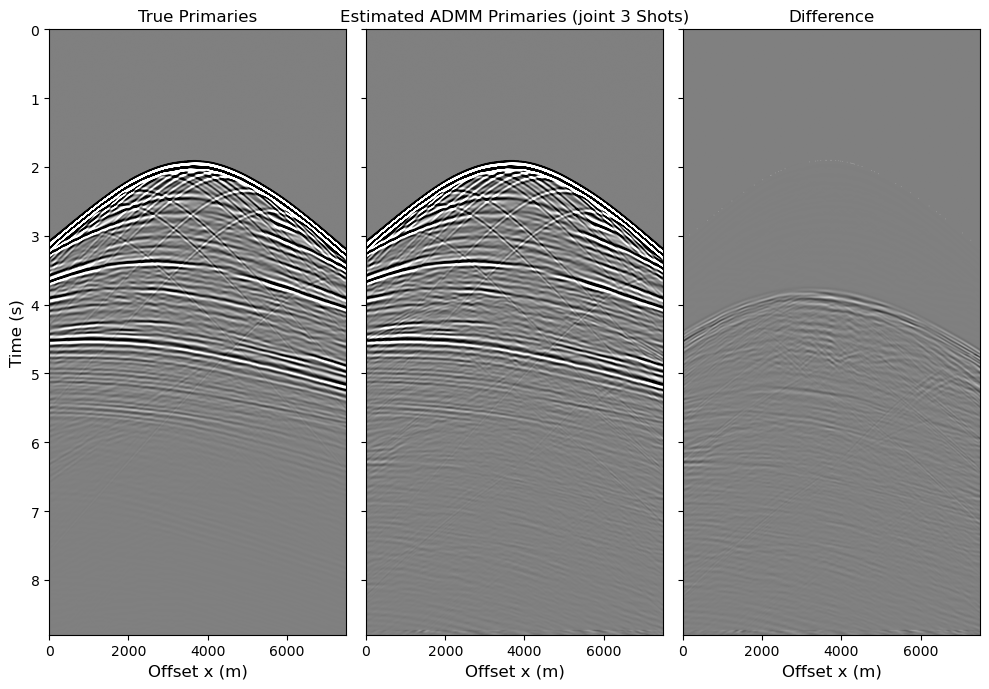

In [71]:
diff = (np.linalg.norm(primaries[300]-prim_admm4)/np.linalg.norm(primaries[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(prim_admm4.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Estimated ADMM Primaries (joint 3 Shots)',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[300]-prim_admm4).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

### WORK IN PROGRESS

#### Now let's try adding a smoothing operator

In [72]:
from ad import ad

In [73]:
start_time = time.time()/60

nfilt = 39
rho = 2  
eps = 0.6 

prim_admm5, mult_admm5, filt_admm5 = ad(data[300], multiples[300], solver='ADMM', nfilt=nfilt,
                                                                        nwin=nwin,
                                                                        solver_dict={'rho':rho,
                                                                                     'nouter':200,
                                                                                     'ninner':5,
                                                                                     'eps':eps})
print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

--- 4.621 minutes ---


Number of patches:  231
Relative error: 17.599999999999998%


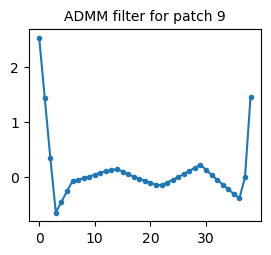

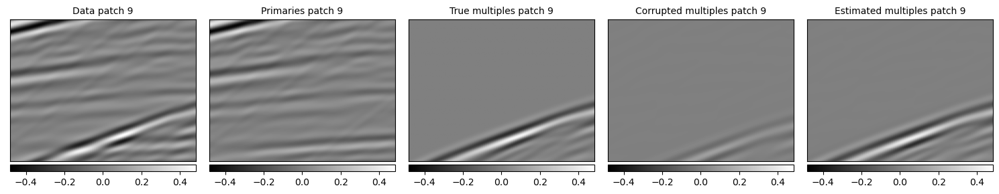

Relative error: 52.5%


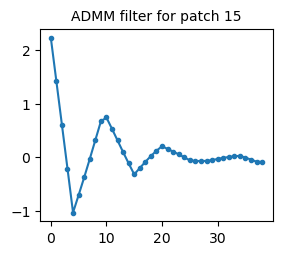

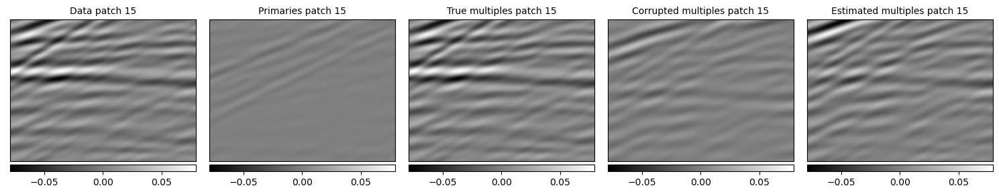

Relative error: 49.1%


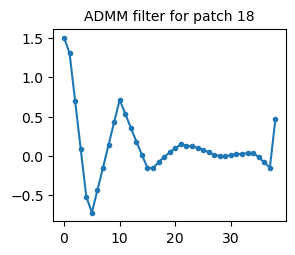

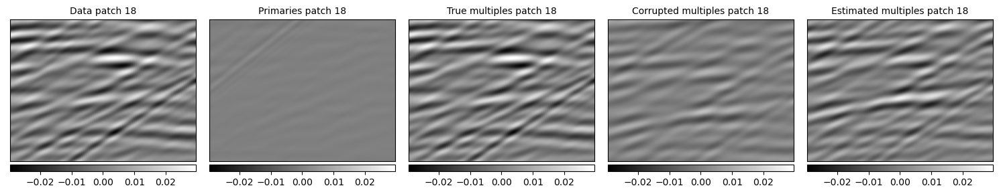

Relative error: 18.0%


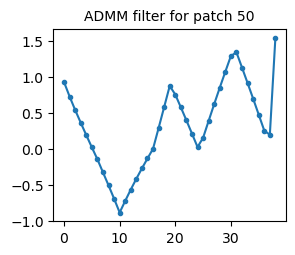

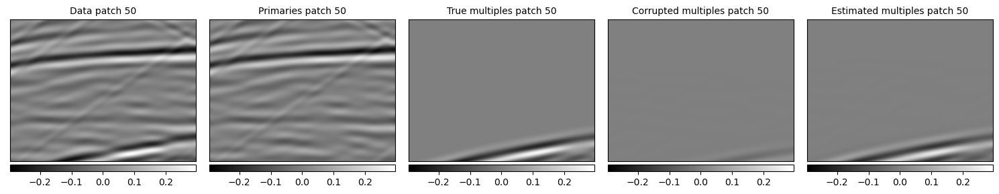

Relative error: 52.0%


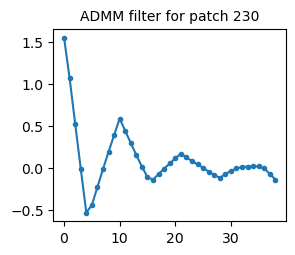

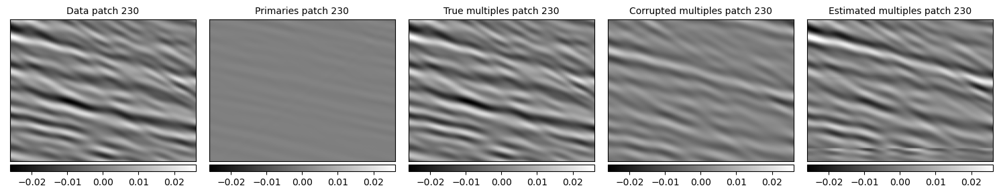

In [74]:
plot_patches(data[300], true_multiples[300], multiples[300], mult_admm5, nwin=nwin, solver='ADMM', filters=filt_admm5, patches=[9, 15, 18, 50, 230])

Relative Error: 25.99 %


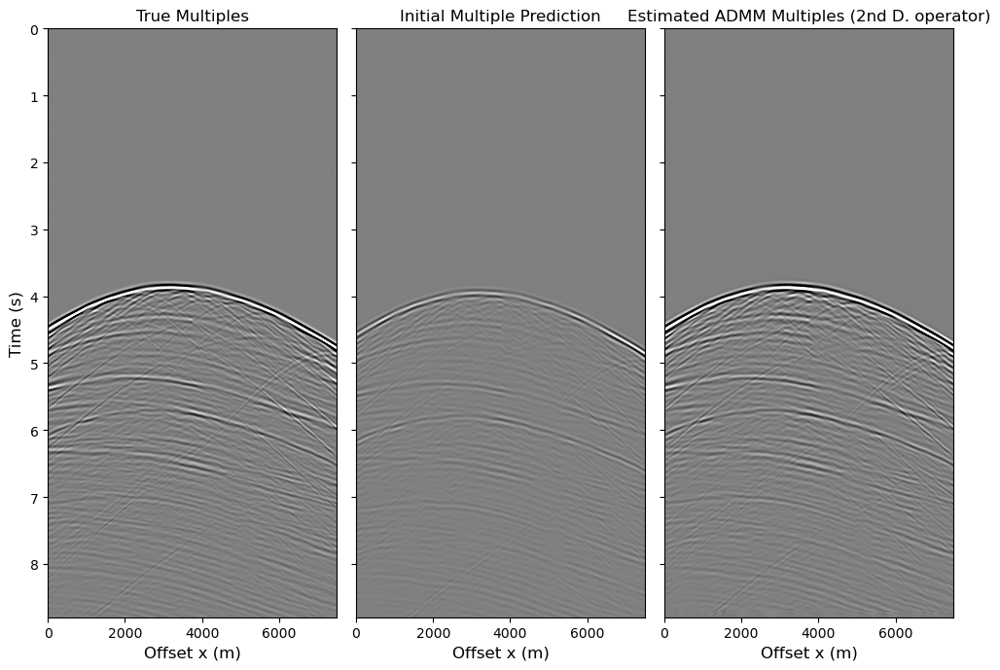

In [78]:
diff = (np.linalg.norm(true_multiples[300]-mult_admm4)/np.linalg.norm(true_multiples[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(true_multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Multiples',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(multiples[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Initial Multiple Prediction',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow(mult_admm4.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Estimated ADMM Multiples (2nd D. operator)',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

Relative Error: 3.502 %


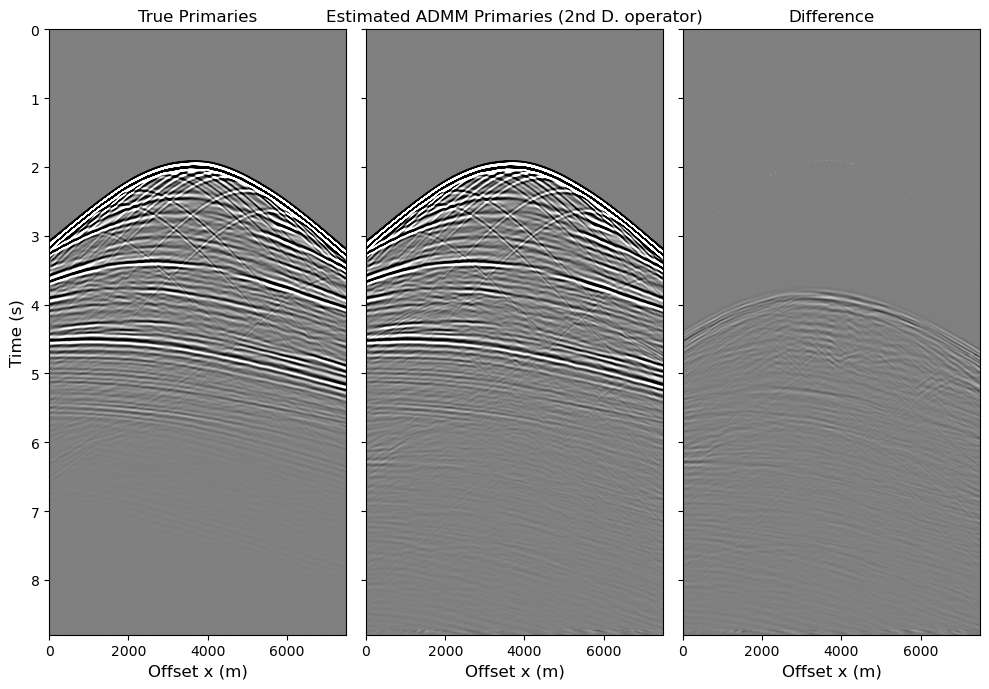

In [80]:
diff = (np.linalg.norm(primaries[300]-prim_admm4)/np.linalg.norm(primaries[300]))*100
print('Relative Error:', round(diff,3), '%')

vmax = 0.03 * np.amax(data)
vmin = -vmax

fig, axs = plt.subplots(1, 3, figsize=(10,7),sharey=True)

axs[0].imshow(primaries[300].T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[0].set_title('True Primaries',fontsize=12)
axs[0].set_xlabel('Offset x (m)',fontsize=12)
axs[0].set_ylabel('Time (s)',fontsize=12)
axs[1].imshow(prim_admm4.T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[1].set_title('Estimated ADMM Primaries (2nd D. operator)',fontsize=12)
axs[1].set_xlabel('Offset x (m)',fontsize=12)
axs[2].imshow((primaries[300]-prim_admm4).T, aspect='auto', vmin=vmin, vmax=vmax, extent=[xmin,xmax,t1,t0], cmap='gray')
axs[2].set_title('Difference',fontsize=12)
axs[2].set_xlabel('Offset x (m)',fontsize=12)

plt.tight_layout()

In [269]:
start_time = time.time()/60

nwin = (100, 200)

eps = 1

rho = 1

admm_filt_errors = []

for nfilt in range(11, 70, 2):

    _, mult_admm, _ = adaptive_subtraction_2d_parallel(data[300], multiples[300], solver='ADMM', nfilt=nfilt,
                                                                nwin=nwin,
                                                                solver_dict={'rho':rho,
                                                                             'nouter':200,
                                                                             'ninner':5,
                                                                             'eps':eps})

    r_error = round((np.linalg.norm(true_multiples[300]-mult_admm)/np.linalg.norm(true_multiples[300]))*100, 3)
    admm_filt_errors.append(r_error)
    print(f'nfilt {nfilt}: {r_error}%')

print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

nfilt 11: 76.183%
nfilt 13: 69.343%
nfilt 15: 61.441%
nfilt 17: 60.779%
nfilt 19: 58.292%
nfilt 21: 58.828%
nfilt 23: 58.118%
nfilt 25: 56.442%
nfilt 27: 51.764%
nfilt 29: 44.359%
nfilt 31: 35.233%
nfilt 33: 29.187%
nfilt 35: 26.56%
nfilt 37: 24.568%
nfilt 39: 24.565%
nfilt 41: 24.899%
nfilt 43: 25.059%
nfilt 45: 25.106%
nfilt 47: 24.993%
nfilt 49: 24.93%
nfilt 51: 24.974%
nfilt 53: 25.022%
nfilt 55: 25.222%
nfilt 57: 25.318%
nfilt 59: 25.413%
nfilt 61: 25.651%
nfilt 63: 25.856%
nfilt 65: 25.824%
nfilt 67: 25.863%
nfilt 69: 25.827%
--- 17.033 minutes ---


In [272]:
x = [nfilt for nfilt in range(11, 70, 2)]

best_filt = np.argmin(admm_filt_errors)

print(f'The best filter size for the ADMM is {x[best_filt]} producing an error of {admm_filt_errors[best_filt]}%')

The best filter size for the ADMM is 39 producing an error of 24.565%


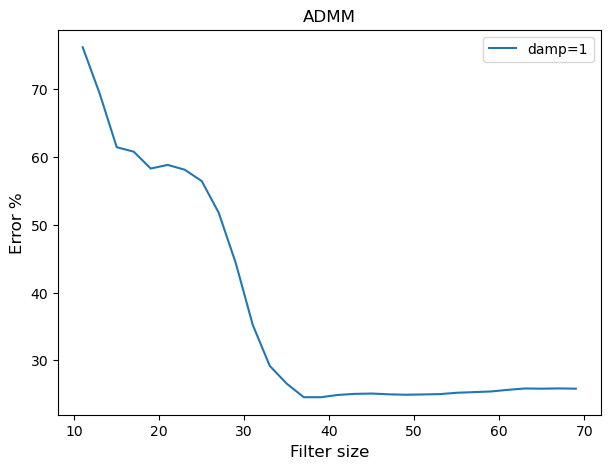

In [273]:
# plot the errors

fig, axs = plt.subplots(1, 1, figsize=(7,5),sharey=True)
axs.plot(x, admm_filt_errors, label='damp=1')
axs.set_ylabel('Error %', fontsize=12)
axs.set_xlabel('Filter size', fontsize=12)
axs.set_title('ADMM')

plt.legend()
plt.show()

In [275]:
e_min = min([values for key, values in admm_filt_errors.items()])
 
for key in admm_filt_errors:
    if admm_filt_errors[key] == e_min:
        params = key
        
print(f'The the minimum relative error for the estimated multiples was {round(e_min,4)}% with {params}')

The the minimum relative error for the estimated multiples was 24.162% with eps0.6_rho2


Let's see the results with the best set of parameters

In [276]:
start_time = time.time()/60

nfilt = 39

mults = npmultiples[299, 300, 301]

admm_filt_errors = {}

for eps in [0.001, 0.01, 0.03, 0.06, 0.1, 0.3, 0.6, 1, 2, 10]:

    for rho in [0.001, 0.01, 0.1, 0.5, 1.5, 2, 2.5, 3]:
        
        _, mult_admm, _ = adaptive_subtraction_2d_parallel_2(data[300], mults, solver='ADMM', nfilt=nfilt,
                                                                    nwin=nwin,
                                                                    solver_dict={'rho':rho,
                                                                                 'nouter':200,
                                                                                 'ninner':5,
                                                                                 'eps':eps})

        r_error = round((np.linalg.norm(true_multiples[300]-mult_admm)/np.linalg.norm(true_multiples[300]))*100, 3)
        admm_filt_errors[f'eps{eps}_rho{rho}'] = r_error

print("--- %s minutes ---" % round((time.time()/60 - start_time), 3))

NameError: free variable 'out' referenced before assignment in enclosing scope

In [ ]:
e_min = min([values for key, values in admm_filt_errors.items()])
 
for key in admm_filt_errors:
    if admm_filt_errors[key] == e_min:
        params = key
        
print(f'The the minimum relative error for the estimated multiples was {round(e_min,4)}% with {params}')